## Preparation


### Load dependencies


In [3]:
%load_ext autoreload
%autoreload 1
%aimport yellow_cards_workflow.data_analysis
%aimport yellow_cards_workflow.calculations
%aimport yellow_cards_workflow

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
from io import BytesIO
from typing import Any, Dict, List, Literal, Optional, Sequence, Tuple

import matplotlib.pyplot as plt
import mordred as md
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display
from matplotlib.patches import Patch, PathPatch, Rectangle
from numpy.typing import NDArray
from tqdm.auto import tqdm
from tqdm.contrib.concurrent import thread_map

from yellow_cards_workflow import (
    BASE_DIR,
    DEFAULT_DATA_OFFSET,
    DEFAULT_DATA_OFFSETS,
    DEFAULT_THRESHOLD,
    DEFAULT_THRESHOLDS,
    SEED,
    MODEL_NAMES,
    DEFAULT_VALUE_NAME,
    TOL
)
from yellow_cards_workflow.calculations import (
    calc_diffs_corrs,
    calc_basic_stats,
    calc_classification_metrics,
    calc_classification_metrics_multi_model,
    calc_groups,
    calc_models_diffs,
    compare_threshold_methods,
    calc_values_diffs,
    get_modified_entries,
)
from yellow_cards_workflow.data_analysis import (
    HATCH_DICT,
    plot_binned_values,
    plot_delta_corr,
    plot_delta_correlations,
    plot_distribution_deltas,
    plot_group_sizes,
    plot_stats_classification,
    # plot_stats_class_curve_v_mpe,
    plot_stats_group,
    plot_stats_models,
)
from yellow_cards_workflow.utils import load_predicted_df
from sklearn.metrics import auc

In [5]:
OUTPUT_FOLDER = BASE_DIR / "data" / "output"

### Set Palette


In [6]:
colorblind = sns.color_palette("colorblind")
colorblind

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [7]:
new_order = [colorblind[i] for i in [0, 3, 7, 2, 5, 4, 6, 8, 1, 9]]
sns.color_palette(new_order)

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [8]:
sns.color_palette("colorblind6")

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [9]:
sns.set_context("paper", font_scale=0.7)

### Descriptor-Based Datasets


#### Noisy


In [12]:
noisy_desc_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-dataset.csv", index_col=0, sep=";"
)
noisy_desc_df = noisy_desc_df.sort_values("smiles").reset_index(drop=True)
noisy_desc_df.index.names = ["#"]

#### Base


In [13]:
base_desc_df = pd.read_csv(
    BASE_DIR / "data/processed/synthetic-clean-dataset.csv", index_col=0, sep=";"
)
base_desc_df = base_desc_df.sort_values("smiles").reset_index(drop=True)
base_desc_df.index.names = ["#"]


#### Shuffled


In [14]:
shuffled_desc_dfs = {}
for file in (BASE_DIR / "data/processed/").glob("predicted-dataset-shuffle-*.csv"):
    shuffled_desc_dfs[float(file.name.split("-")[3])] = load_predicted_df(
        file, model_names=MODEL_NAMES
    )
shuffled_desc_dfs = pd.concat(shuffled_desc_dfs,names=["modified_%", "#"])
shuffled_desc_dfs

smiles  \
modified_% #                                                          
0.0        0                           Brc1c(Br)c(Br)c2[nH]cnc2c1Br   
           1                           Brc1c(Br)c(Br)c2[nH]nnc2c1Br   
           2                 Brc1ccc(-c2ccc(CN=c3nc[nH][nH]3)o2)cc1   
           3                      Brc1ccc(-c2ccc(CNCC3CCNCC3)o2)cc1   
           4                  Brc1ccc(-c2ccc(CNC[C@@H]3CCCO3)o2)cc1   
...                                                             ...   
5.0        79885             c1nc2c(c(=NCc3ccc4c(c3)OCO4)[nH]1)CCC2   
           79886                c1nc2c(c(N3CCC(N4CCCCC4)CC3)n1)CCC2   
           79887  c1nc2ccc(-c3nc(-c4ccc5c(c4)nnn5CCN4CCCCC4)no3)...   
           79888              c1nn2cnnc2cc1N1CCN(Cc2csc3c2CCCC3)CC1   
           79889                             c1nnc(C2CC2)n1C1CCNCC1   

                                                              inchi    values  \
modified_% #                                                                    
0.0        0      InChI=1S/C7H2Br4N2/c8-2-3(9)5(11)7-6(4(2)10)12...  0.678912   
           1      InChI=1S/C6HBr4N3/c7-1-2(8)4(10)6-5(3(1)9)11-1...  0.815859   
           2      InChI=1S/C13H11BrN4O/c14-10-3-1-9(2-4-10)12-6-... -0.359711   
           3      InChI=1S/C17H21BrN2O/c18-15-3-1-14(2-4-15)17-6... -0.372272   
           4      InChI=1S/C16H18BrNO2/c17-13-5-3-12(4-6-13)16-8... -0.392074   
...                                                             ...       ...   
5.0        79885  InChI=1S/C15H15N3O2/c1-2-11-12(3-1)17-8-18-15(... -0.423653   
           79886  InChI=1S/C17H26N4/c1-2-9-20(10-3-1)14-7-11-21(... -0.306283   
           79887  InChI=1S/C22H22N8O/c1-2-8-29(9-3-1)10-11-30-20...  0.200500   
           79888  InChI=1S/C18H22N6S/c1-2-4-17-16(3-1)14(12-25-1... -0.121405   
           79889  InChI=1S/C10H16N4/c1-2-8(1)10-13-12-7-14(10)9-... -0.658269   

                       cnn       gnn      fcfp       fcd        cb  
modified_% #                                                        
0.0        0      0.183134 -0.147329 -0.296589  0.169461 -0.153610  
           1      0.327013 -0.036774 -0.369125  0.259861 -0.117171  
           2     -0.349868 -0.332834 -0.354112 -0.377647 -0.329061  
           3     -0.359002 -0.361805 -0.360321 -0.353415 -0.346289  
           4     -0.396241 -0.382704 -0.390517 -0.397570 -0.383124  
...                    ...       ...       ...       ...       ...  
5.0        79885 -0.408230 -0.433601 -0.434258 -0.426839 -0.429857  
           79886 -0.288710 -0.314050 -0.222732 -0.277924 -0.328154  
           79887  0.216491  0.188318  0.173020  0.200960  0.196322  
           79888 -0.121222 -0.101615 -0.115270 -0.106122 -0.113770  
           79889 -0.619410 -0.671227 -0.703988 -0.654442 -0.653749  

[479340 rows x 8 columns]

#### Variable Addition


In [15]:
variable_add_desc_dfs = {}
for j in [0.025, 0.04, 0.05, 0.075, 0.1, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = BASE_DIR / f"data/processed/predicted-variable-mu-{j}-{i}-42.csv"
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    variable_add_desc_dfs[j] = pd.concat(temp_dict, names=["modified_%", "#"])
variable_add_desc_dfs = pd.concat(variable_add_desc_dfs, names=["var_add"])

### QM9


#### Clean


In [16]:
base_qm9_df = pd.read_csv(BASE_DIR / "data/processed/qm9-clean.csv", sep=";")
base_qm9_df["values"] = base_qm9_df["g298_atom"] / (-1000)
base_qm9_df.index.names = ["#"]

#### Shuffled


In [17]:
shuffled_qm9_dfs = {}
for i in [0.0, 0.5, 1, 2.5, 5, 10]:
    filename = BASE_DIR / f"data/processed/qm9-shuffle-predictions-{i}-42.csv"
    try:
        shuffled_qm9_dfs[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
    except FileNotFoundError:
        print(f"{filename} not found")
        continue
shuffled_qm9_dfs = pd.concat(shuffled_qm9_dfs,names=["modified_%", "#"])

#### Variable Addition


In [18]:
variable_add_qm9_dfs = {}
for j in [0.0075, 0.0125, 0.015, 0.0175, 0.02, 0.025, 0.05, 0.08, 0.15, 0.25]:
    temp_dict = {}
    for i in [0.5, 1, 2.5, 5, 10]:
        filename = (
            BASE_DIR / f"data/processed/qm9-variable-mu-predictions-{j}-{i}-42.csv"
        )
        try:
            temp_dict[i] = load_predicted_df(filename, model_names=MODEL_NAMES)
        except FileNotFoundError:
            print(f"{filename} not found")
            continue
    variable_add_qm9_dfs[j] = pd.concat(temp_dict, names=["modified_%", "#"])
variable_add_qm9_dfs = pd.concat(variable_add_qm9_dfs, names=["var_add"])

### GNN


In [19]:
gnn_df = pd.concat(
    [
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-42-46-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
        pd.read_csv(
            BASE_DIR / "data/processed/predicted-GNN-only-shuffle-47-52-2.5.csv",
            index_col=[0, 1],
            sep=";",
        ),
    ]
)
gnn_df["gnn"] = [float(x.strip("[]")) for x in gnn_df["gnn"].to_numpy()]
gnn_df = (
    gnn_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["gnn", "values"])
    .reset_index()
)

gnn_df.set_index(["smiles", "inchi"], append=True).stack(future_stack=True)
gnn_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in gnn_df.columns]
gnn_df["values"] = gnn_df["values-42"]
gnn_df = gnn_df.drop(columns=[x for x in gnn_df.columns if "values-" in x])
gnn_df = gnn_df.sort_values("smiles").reset_index(drop=True)
gnn_df.index.names = ["#"]
gnn_models = [x for x in gnn_df.columns if x.startswith("gnn")]
gnn_df.head()

,smiles,inchi,gnn-42,gnn-43,gnn-44,gnn-45,gnn-46,gnn-47,gnn-48,gnn-49,gnn-50,gnn-51,values
#,,,,,,,,,,,,,
0,Brc1c(Br)c(Br)c2[nH]cnc2c1Br,InChI=1S/C7H2Br4N2/c8-2-3(9)5(11)7-6(4(2)10)12...,-0.090712,0.578620,0.312483,0.650743,0.448968,0.749590,0.062619,0.619823,0.525567,0.627433,0.678912
1,Brc1c(Br)c(Br)c2[nH]nnc2c1Br,InChI=1S/C6HBr4N3/c7-1-2(8)4(10)6-5(3(1)9)11-1...,-0.029662,0.504092,0.572793,0.854348,0.337776,0.539971,0.148910,0.925470,0.628134,0.900105,0.815859
2,Brc1ccc(-c2ccc(CN=c3nc[nH][nH]3)o2)cc1,InChI=1S/C13H11BrN4O/c14-10-3-1-9(2-4-10)12-6-...,-0.337336,-0.328779,-0.290211,-0.332864,-0.329733,-0.326868,-0.364423,-0.365485,-0.372686,-0.348533,-0.359711
3,Brc1ccc(-c2ccc(CNCC3CCNCC3)o2)cc1,InChI=1S/C17H21BrN2O/c18-15-3-1-14(2-4-15)17-6...,-0.359819,-0.349863,-0.372720,-0.357736,-0.364960,-0.356615,-0.384397,-0.374281,-0.371516,-0.348271,-0.372272
4,Brc1ccc(-c2ccc(CNC[C@@H]3CCCO3)o2)cc1,InChI=1S/C16H18BrNO2/c17-13-5-3-12(4-6-13)16-8...,-0.400038,-0.386987,-0.377928,-0.390635,-0.401624,-0.404578,-0.411900,-0.394775,-0.388018,-0.400449,-0.392074


### FCFP


In [20]:
shuffle_comp = load_predicted_df(
    BASE_DIR / "data/processed/predicted-dataset-shuffle-2.5-42.csv",
    model_names=MODEL_NAMES,
)
shuffle_comp = shuffle_comp.sort_values("smiles").reset_index(drop=True)
shuffle_comp.index.names = ["#"]
fcfp_df = pd.read_csv(
    BASE_DIR / "data/processed/predicted-FCFP-only-shuffle-42-51-2.5.csv",
    index_col=[0, 1],
    sep=";",
)
fcfp_df["fcfp"] = [float(x.strip("[]")) for x in fcfp_df["fcfp"].to_numpy()]
fcfp_df = (
    fcfp_df.reset_index(names=["seed", "idx"])
    .pivot(index=["smiles", "inchi"], columns=["seed"], values=["fcfp", "values"])
    .reset_index()
)
fcfp_df.columns = [f"{x}-{y}" if y else str(x) for (x, y) in fcfp_df.columns]
fcfp_df["values"] = fcfp_df["values-42"]
fcfp_df = fcfp_df.drop(columns=[x for x in fcfp_df.columns if "values-" in x])
fcfp_df = fcfp_df.sort_values("smiles").reset_index(drop=True)
fcfp_df.index.names = ["#"]
fcfp_models = [x for x in fcfp_df.columns if x.startswith("fcfp")]

### METLIN SMRT


In [21]:
metlin_df = pd.read_csv(BASE_DIR / "data/input/metlin-predicted-rts-1.csv", index_col=0)
metlin_df.index.names = ["#"]
metlin_models = metlin_df.columns[:-2].to_list()

### NIST RI 2017


In [22]:
nist_df = pd.read_csv(BASE_DIR / "data/input/nist-predicted-1.csv")
nist_df.index.names = ["#"]
nist_models = nist_df.columns[3:].to_list()

## Methods


### Datasets


Figure S1


In [25]:
from yellow_cards_workflow import BASE_DIR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


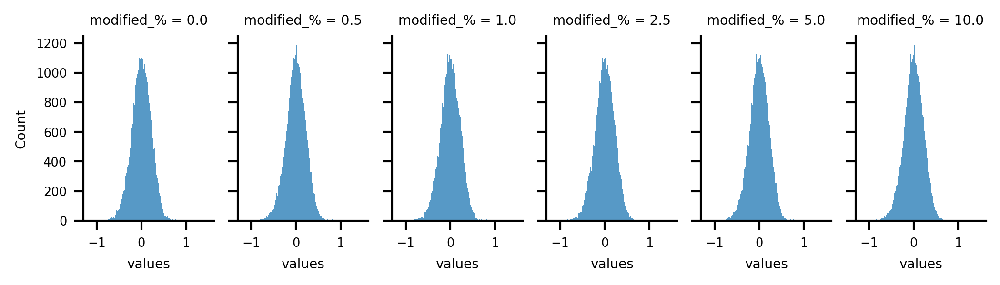

In [26]:
fg = sns.displot(
    data=shuffled_desc_dfs,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S1.eps")

Figure S2


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


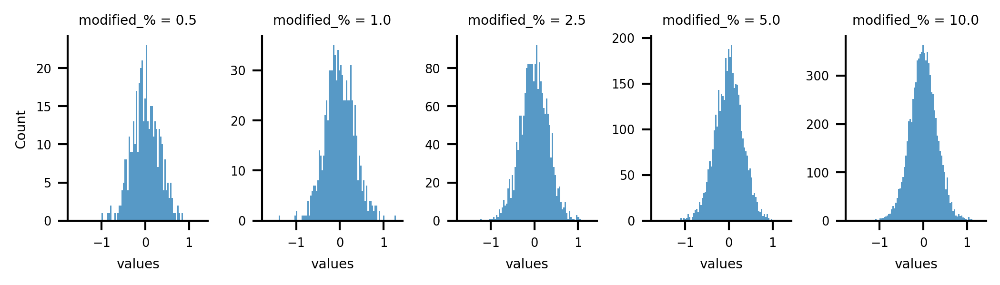

In [27]:
fg = plot_distribution_deltas(
    shuffled_desc_dfs, noisy_desc_df, "values", height=2, aspect=0.5
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S2.eps")

Figure S3


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


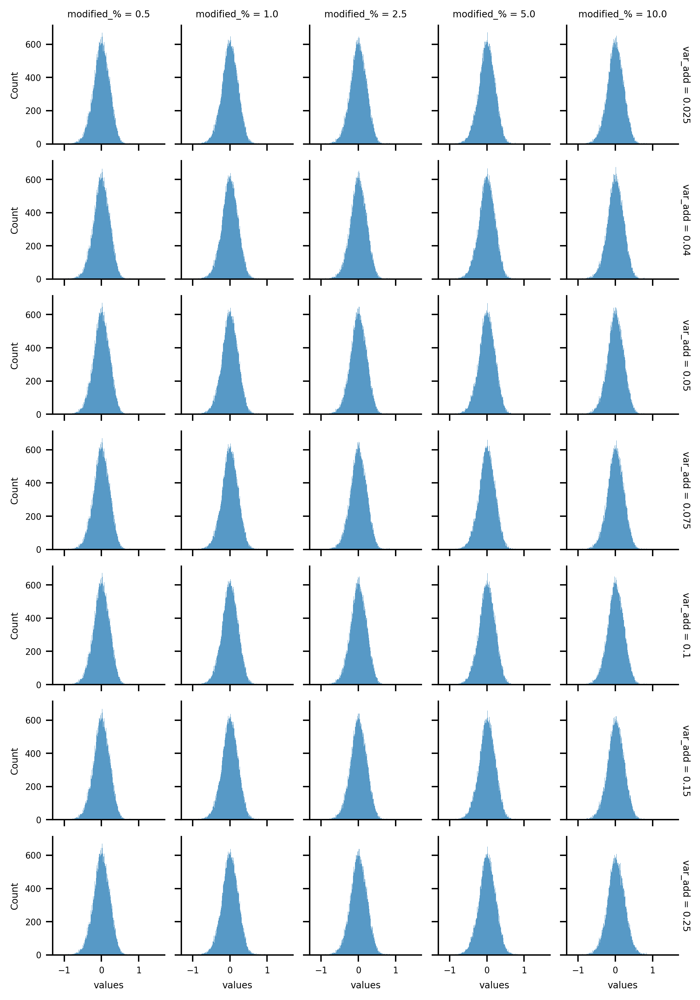

In [28]:
fg = sns.displot(
    data=variable_add_desc_dfs,
    x="values",
    col="modified_%",
    row="var_add",
    height=1.5,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S3.eps")

Figure S4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


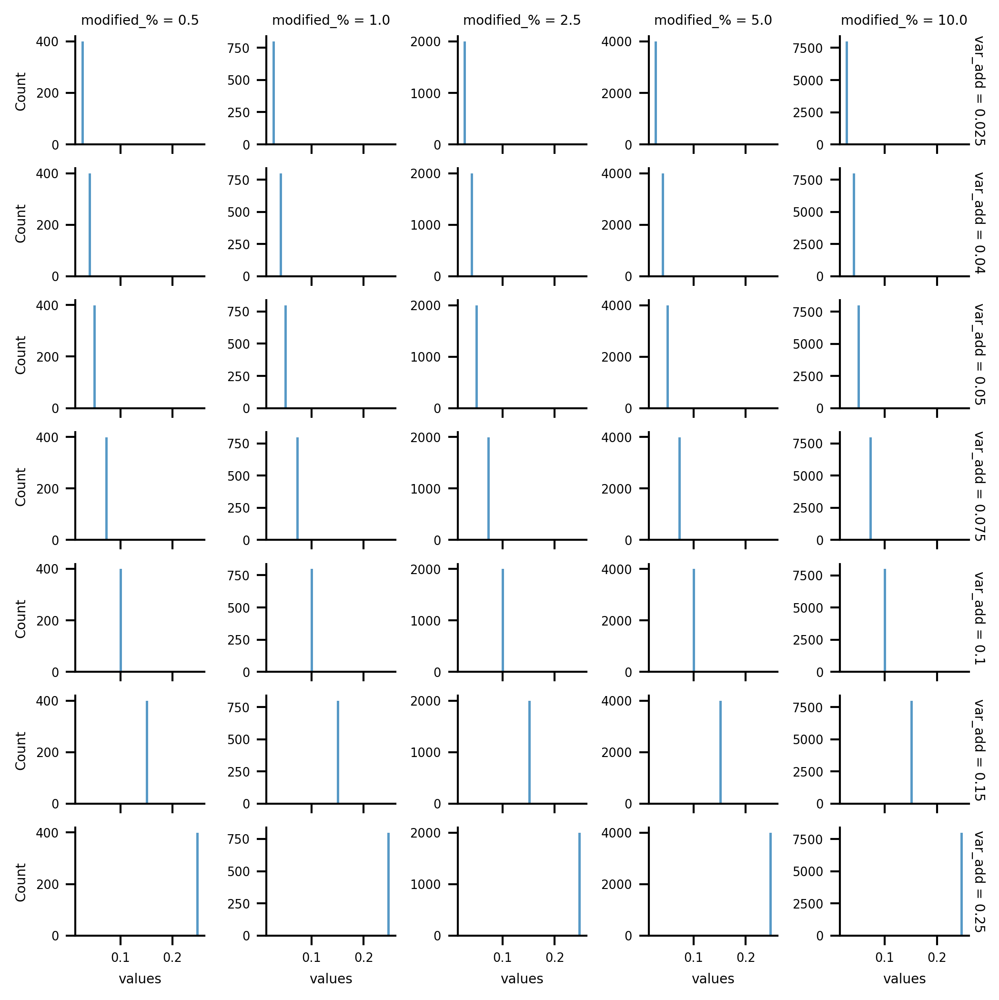

In [29]:
fg = plot_distribution_deltas(
    variable_add_desc_dfs, noisy_desc_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S4.eps")

Figure S5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


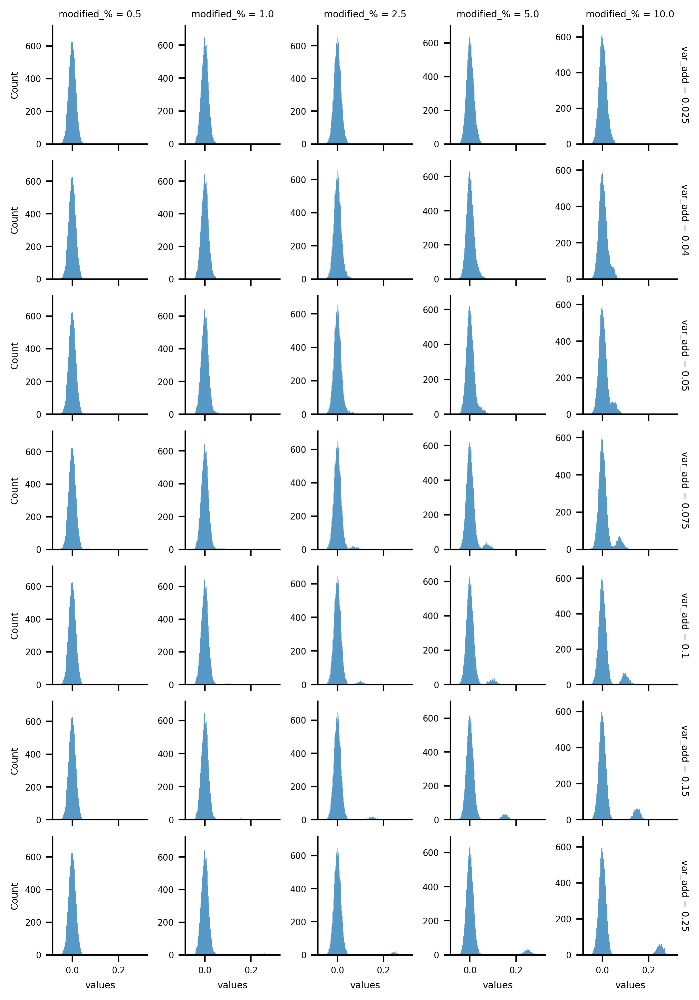

In [30]:
fg = plot_distribution_deltas(
    variable_add_desc_dfs, base_desc_df, "values", margin_titles=True
)
fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S5.eps")

Figure S6


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


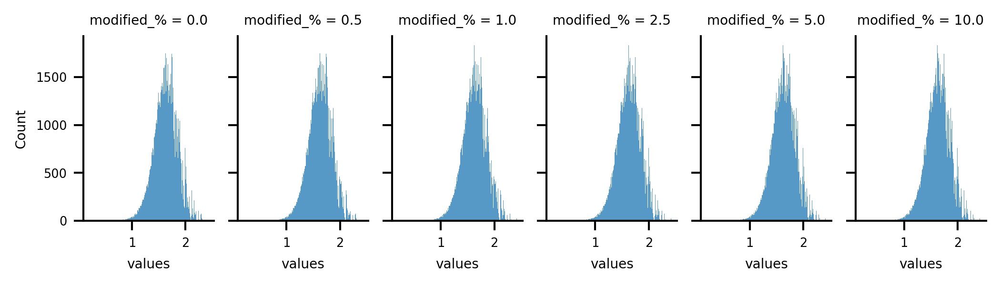

In [31]:
fg = sns.displot(
    data=shuffled_qm9_dfs,
    x="values",
    col="modified_%",
    row=None,
    height=2,
    aspect=1,
    edgecolor=None,
    lw=0,
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S6.eps")

Figure S7


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


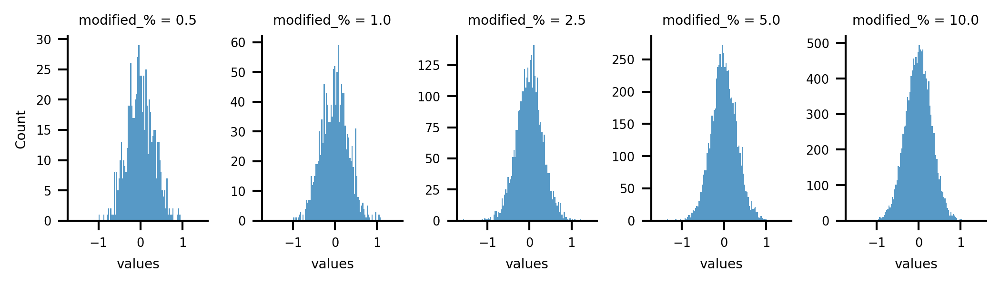

In [32]:
fg = plot_distribution_deltas(
    shuffled_qm9_dfs, base_qm9_df, "values", height=2, aspect=0.5
)
# fg.set_titles(template="{row_var} = {row_name}\n{col_var} = {col_name}")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S7.eps")

Figure S8


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


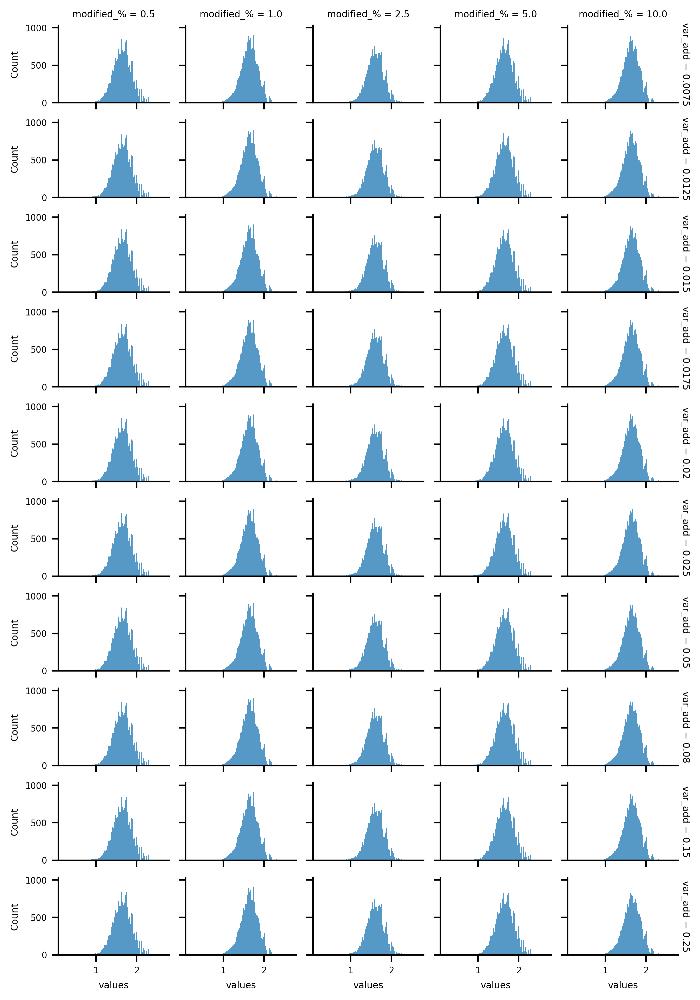

In [33]:
fg = sns.displot(
    data=variable_add_qm9_dfs,
    x="values",
    col="modified_%",
    row="var_add",
    height=2,
    aspect=0.5,
    edgecolor=None,
    lw=0,
    facet_kws=dict(margin_titles=True),
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S8.eps")

Figure S9


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


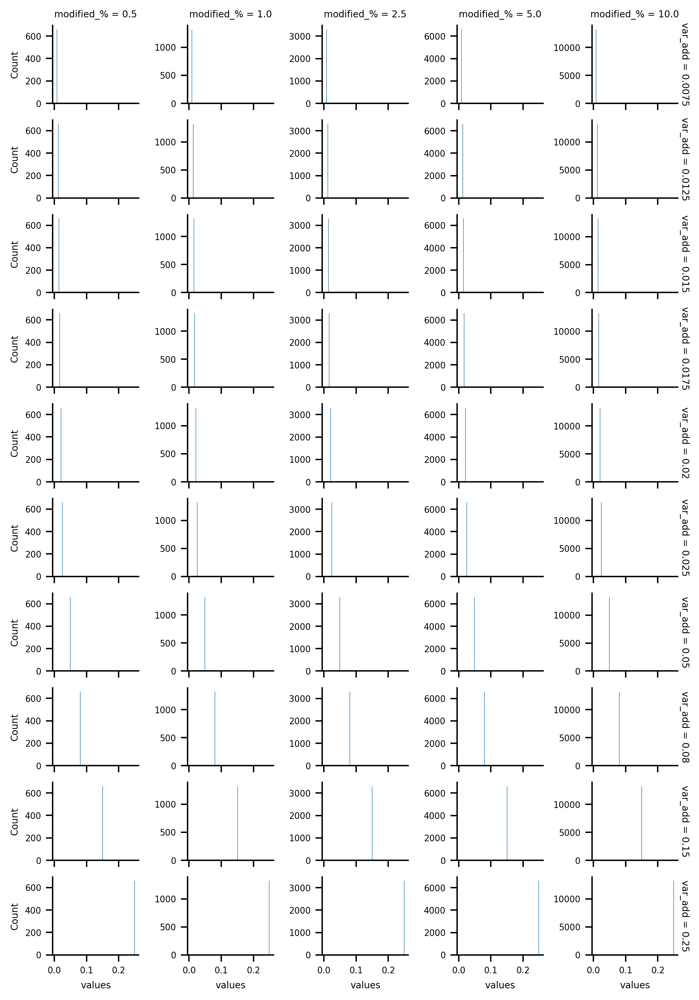

In [34]:
fg = plot_distribution_deltas(
    variable_add_qm9_dfs, base_qm9_df, "values", height=2, aspect=1, margin_titles=True
)
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S9.eps")

## Results and Discussion


### Impact of Errors in Training Datasets on Prediction Accuracy


Figure 1


array([3.34645669, 2.5       ])

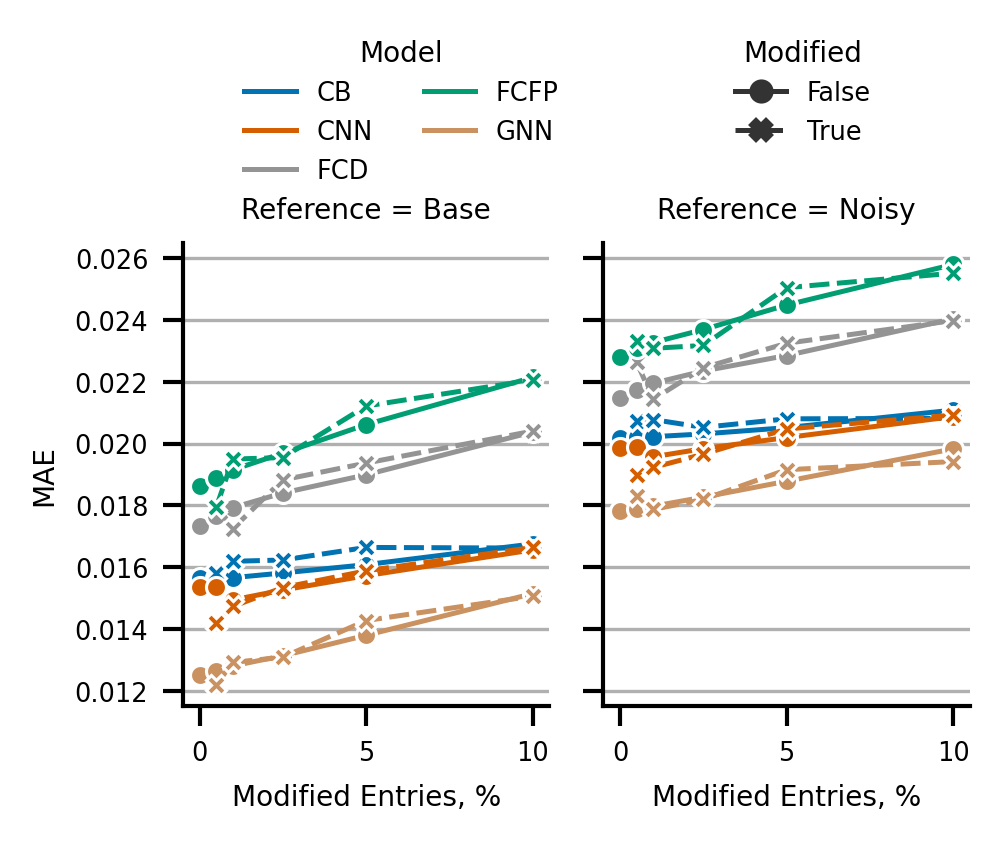

In [35]:
noisy_stats = calc_models_diffs(
    dataframe=shuffled_desc_dfs,
    ref_data=noisy_desc_df,
)
noisy_stats["modified"] = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
)
clean_stats = calc_models_diffs(
    dataframe=shuffled_desc_dfs,
    ref_data=base_desc_df,
)
clean_stats["modified"] = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
)
plot_df = pd.concat({"Noisy": noisy_stats, "Base": clean_stats}, names=["Reference"])
plot_df["model_name"] = plot_df["model_name"].str.upper()
plot_df = plot_df.set_index(["model_name", "modified"], append=True)
plot_df.index.rename(
    ["Reference", "Modified Entries, %", "#", "Model", "Modified"], inplace=True
)
id_vars = ["Modified Entries, %", "Model", "Reference", "Modified"]
plot_df = plot_df.groupby(id_vars)["delta_abs"].mean().to_frame("MAE").reset_index()
# plot_df
sns.set_context("paper", font_scale=0.7)
fg = sns.relplot(
    data=plot_df,
    x="Modified Entries, %",
    y="MAE",
    style="Modified",
    row=None,
    col="Reference",
    hue="Model",
    kind="line",
    markers=True,
    palette="colorblind_reordered",
    height=2.5,
    aspect=0.6,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")

handles, labels = fg.axes[0, 0].get_legend_handles_labels()

# Separate by your variables
model_handles = [h for h, l in zip(handles, labels) if l in plot_df["Model"].unique()]
model_labels = [l for l in labels if l in plot_df["Model"].unique()]

mod_handles = [
    h for h, l in zip(handles, labels) if l in plot_df["Modified"].unique().astype(str)
]
mod_labels = [l for l in labels if l in plot_df["Modified"].unique().astype(str)]

# Remove the auto legend
fg.legend.remove()

# Add them back separately
fg.figure.legend(
    model_handles,
    model_labels,
    title="Model",
    loc="upper center",
    bbox_to_anchor=(0.4, 1.1),
    ncol=2,
    frameon=False,
)

fg.figure.legend(
    mod_handles,
    mod_labels,
    title="Modified",
    loc="upper center",
    bbox_to_anchor=(0.8, 1.1),
    ncol=1,
    frameon=False,
)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_1.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_1.eps")
np.array(fg.figure.get_size_inches())
# fg.figure.get_tightbbox()

Figure S10


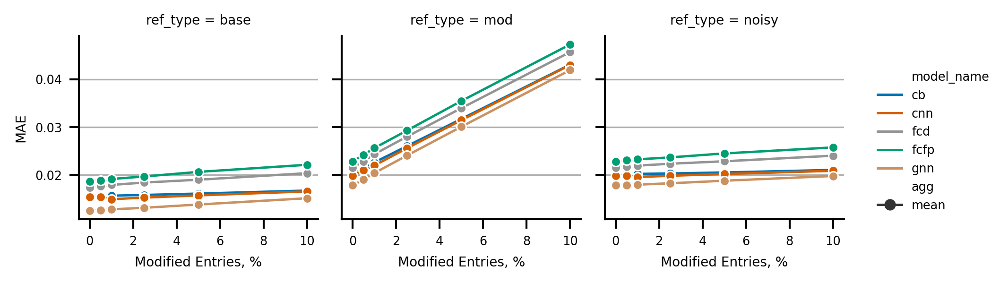

In [36]:
fg = plot_stats_models(
    dataframe=shuffled_desc_dfs,
    ref_data=noisy_desc_df,
    original_data=base_desc_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S10.eps")

Figure S11


[7.08661417 4.        ]


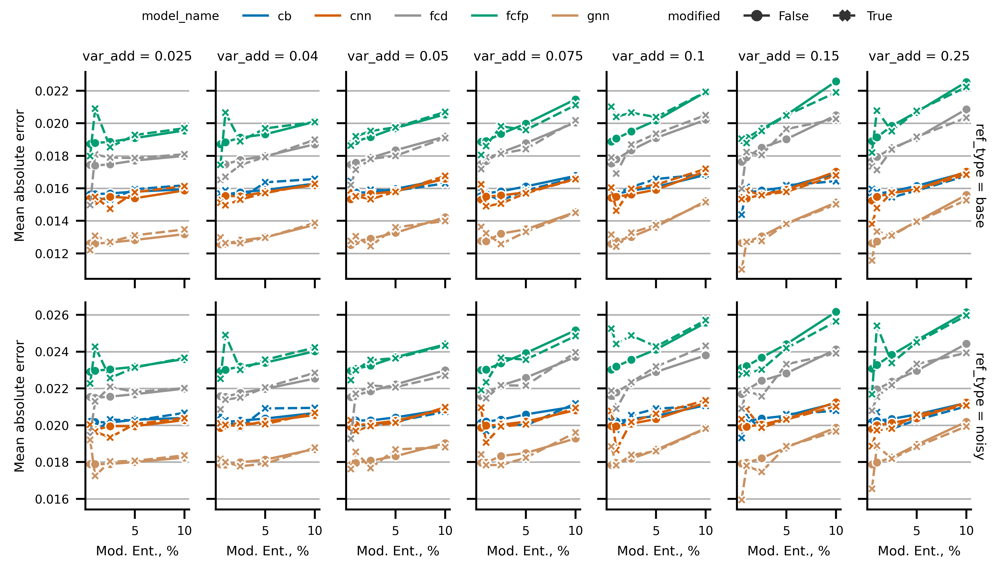

In [37]:
fg = plot_stats_models(
    dataframe=variable_add_desc_dfs,
    ref_data=noisy_desc_df,
    original_data=base_desc_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    row="ref_type",
    style="modified",
    col="var_add",
    agg="mean",
    delta_type="delta_abs",
    split_modified=True,
    ignore_mod_df=True,
    facet_kws=dict(sharey="row", margin_titles=True),
    height=2,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("Mean absolute error")
fg.set_xlabels("Mod. Ent., %")
fg.figure.set_dpi(600)
fg.figure.set_figwidth(180 / 25.4)
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
sns.move_legend(fg, loc="upper center", ncols=10)
fg.tight_layout(rect=(0, 0, 1, 0.95))
print(fg.figure.get_size_inches())
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S11.eps")

Figure S12


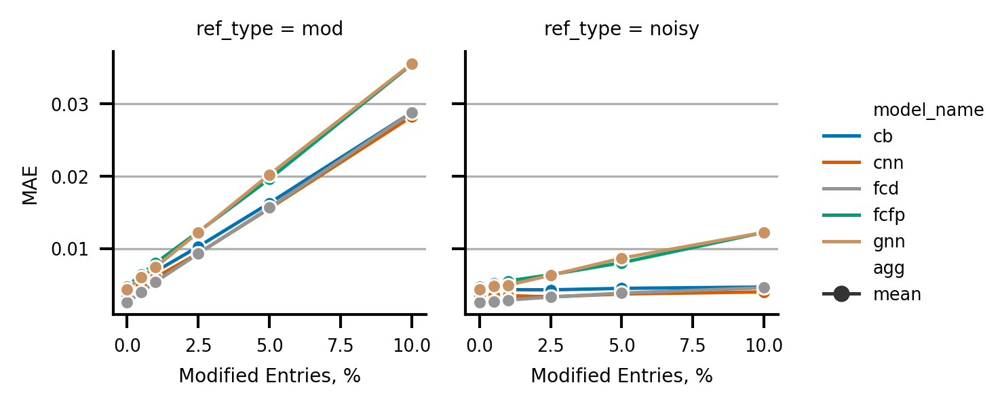

In [38]:
fg = plot_stats_models(
    dataframe=shuffled_qm9_dfs,
    ref_data=base_qm9_df,
    # original_data=base_qm9_df,
    model_names=MODEL_NAMES,
    data_offset=DEFAULT_DATA_OFFSET,
    x_var="modified_%",
    hue="model_name",
    col="ref_type",
    # style="modified",
    row=None,
    agg="mean",
    delta_type="delta_abs",
    split_modified=False,
    ignore_mod_df=False,
    facet_kws=dict(
        sharey="row",
    ),
    height=2,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y")
fg.set_ylabels("MAE")
fg.set_xlabels("Modified Entries, %")
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(7)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S12.eps")

### Correlations Between Errors of Predictions of the Models


Figure 2


array([3.34645669, 4.95      ])

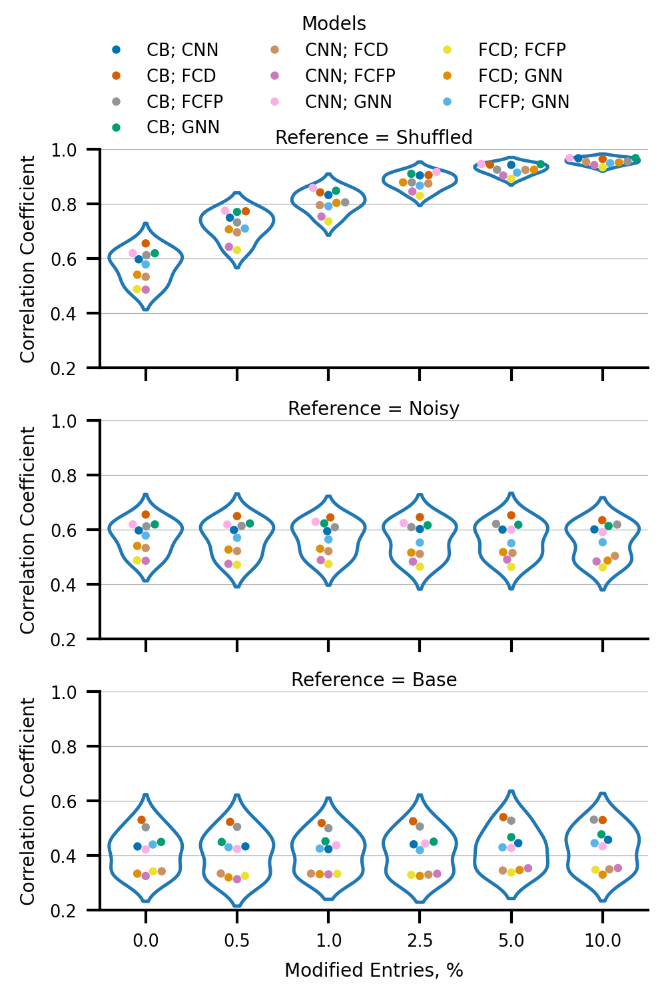

In [39]:
mod_corr = calc_diffs_corrs(dataframe=shuffled_desc_dfs, ref_data=None, data_offset=1.5)
noisy_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df, data_offset=1.5
)
clean_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=base_desc_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Shuffled": mod_corr, "Noisy": noisy_corr, "Base": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Reference",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Models",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, row="Reference", col=None, height=1.65, aspect=2, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Models",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Models")
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.savefig(BASE_DIR / "reports/figures/Figure_2.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2.eps")
np.array(fg.figure.get_size_inches())

array([6.1655, 3.    ])

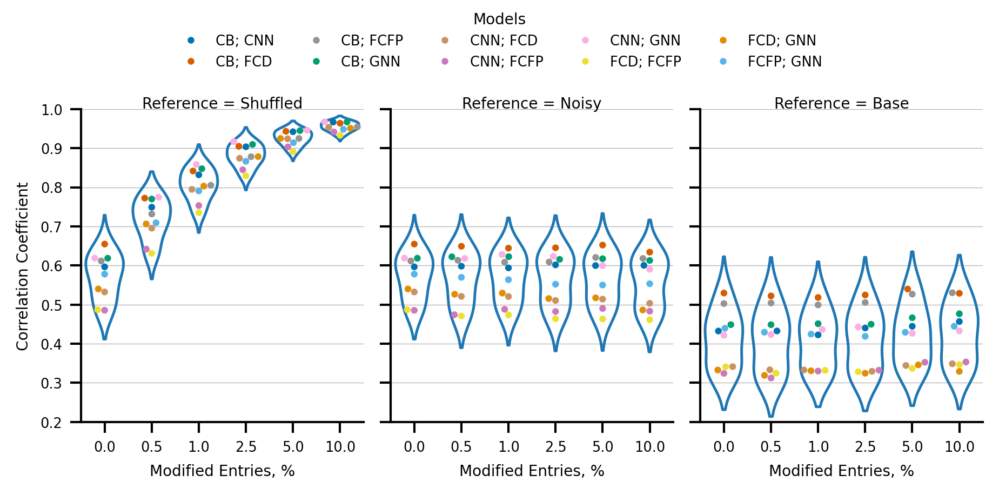

In [40]:
mod_corr = calc_diffs_corrs(dataframe=shuffled_desc_dfs, ref_data=None, data_offset=1.5)
noisy_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df, data_offset=1.5
)
clean_corr = calc_diffs_corrs(
    dataframe=shuffled_desc_dfs, ref_data=base_desc_df, data_offset=1.5
)
plot_df = pd.concat(
    {"Shuffled": mod_corr, "Noisy": noisy_corr, "Base": clean_corr}, names=["Reference"]
)
# plot_df = plot_df.set_index("Reference", append=True)

plot_df.columns.name = "model_name_2"
plot_df = plot_df.melt(ignore_index=False).reset_index(
    # level=-1
)
plot_df = plot_df[plot_df["model_name"] != plot_df["model_name_2"]]
plot_df["pair"] = plot_df[["model_name", "model_name_2"]].apply(
    lambda x: "; ".join(sorted(x)), axis=1
)
plot_df = plot_df.sort_values("pair")
plot_df["pair"] = plot_df["pair"].str.upper()
id_vars = ["modified_%", "pair", "Reference"]
id_vars = [x for x in id_vars if x in plot_df.columns]
plot_df = plot_df.drop_duplicates(id_vars)
plot_df = plot_df.drop(columns=["model_name", "model_name_2"])
plot_df.columns = [
    "Reference",
    "Modified Entries, %",
    "Correlation Coefficient",
    "Models",
]
sns.set_context("paper", font_scale=0.7)
fg = sns.FacetGrid(
    plot_df, col="Reference", row=None, height=3, aspect=0.6, sharey=True
)
fg.map_dataframe(
    sns.swarmplot,
    # sns.stripplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    hue="Models",
    palette="colorblind_reordered",
    s=3,
    # marker="_",
    # linewidth=2,
)
fg.map_dataframe(
    sns.violinplot,
    x="Modified Entries, %",
    y="Correlation Coefficient",
    # hue="Reference",
    inner=None,
    fill=False,
    density_norm="width",
    # palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
    ax.set_title(y=0.975, label=ax.title.get_text(), pad=4)
fg.set(ylim=(0.2, 1.0))
fg.add_legend(title="Models")
sns.move_legend(fg, "upper center", ncols=5)
fg.figure.set_dpi(300)
# fg.figure.set_figwidth(85 / 25.4)
fg.figure.subplots_adjust(hspace=0.1, bottom=0.1)
fg.tight_layout(rect=(0, 0, 1, 0.85))
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_2-horizontal.eps")
np.array(fg.figure.get_size_inches())

Figure S13a


d:\Research\Repositories\yellow-cards-workflow\.venv\Lib\site-packages\seaborn\categorical.py:3399: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


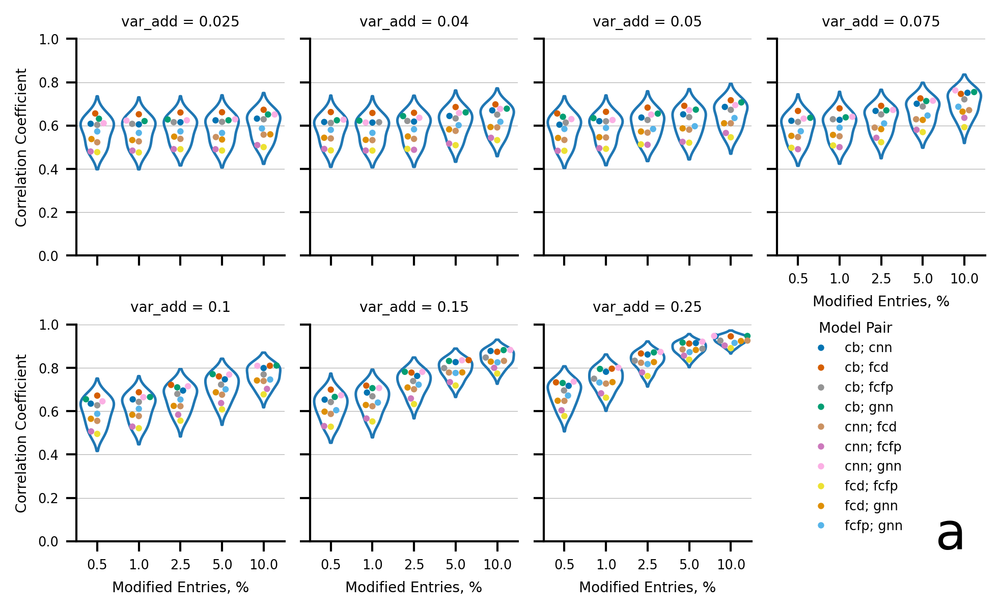

In [42]:
fg = plot_delta_correlations(variable_add_desc_dfs, s=3, height=2, aspect=1.5, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13a.eps")

Figure S13b

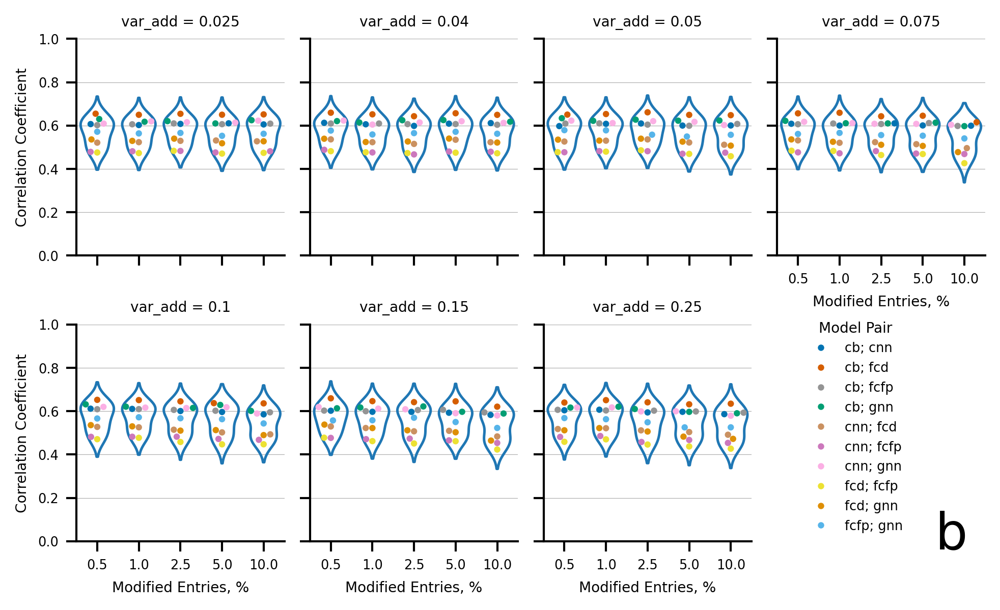

In [43]:
fg = plot_delta_correlations(
    variable_add_desc_dfs, ref_data=noisy_desc_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13b.eps")

Figure S13c

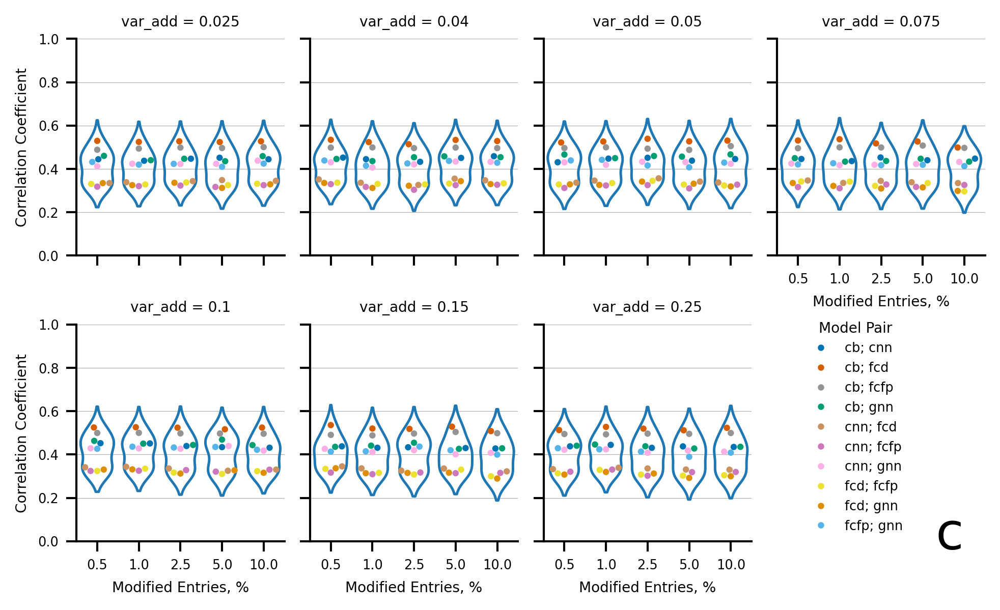

In [44]:
fg = plot_delta_correlations(
    variable_add_desc_dfs, ref_data=base_desc_df, s=3, height=2, aspect=1.5, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.8, 0.3))
fg.figure.text(x=0.875, y=0.1, s="c", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S13c.eps")

Figure S14a


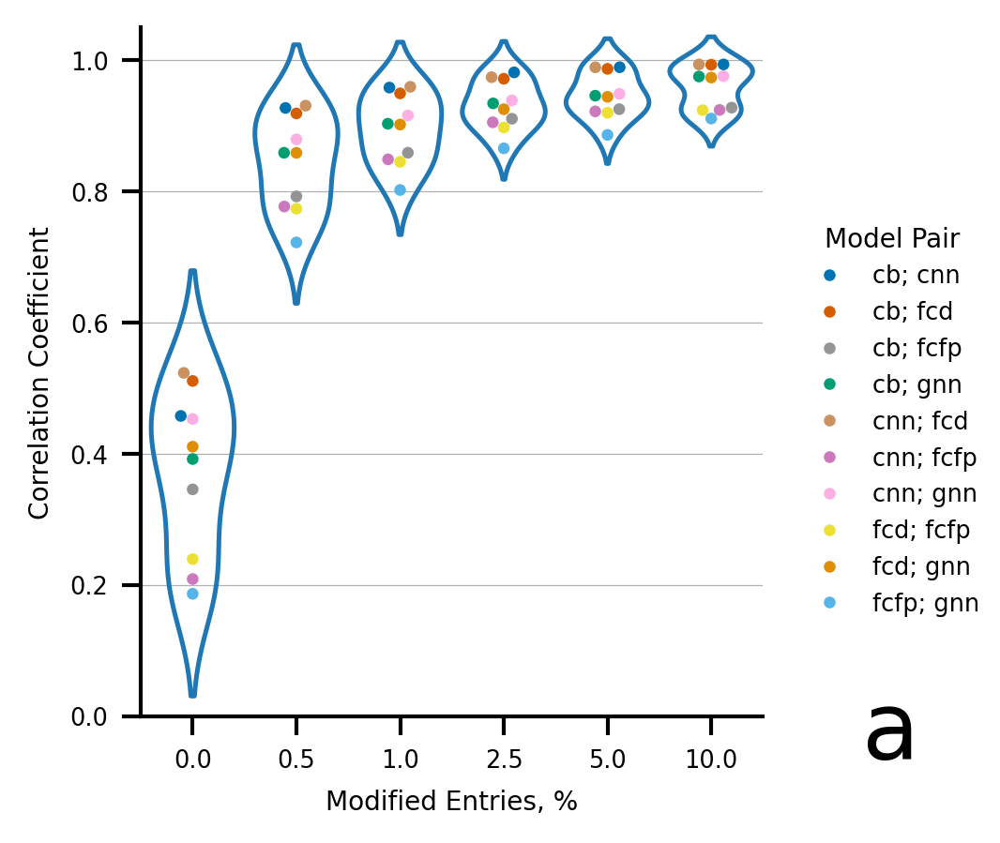

In [45]:
fg = plot_delta_correlations(shuffled_qm9_dfs, s=3, height=3, aspect=1)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14a.eps")

Figure S14b

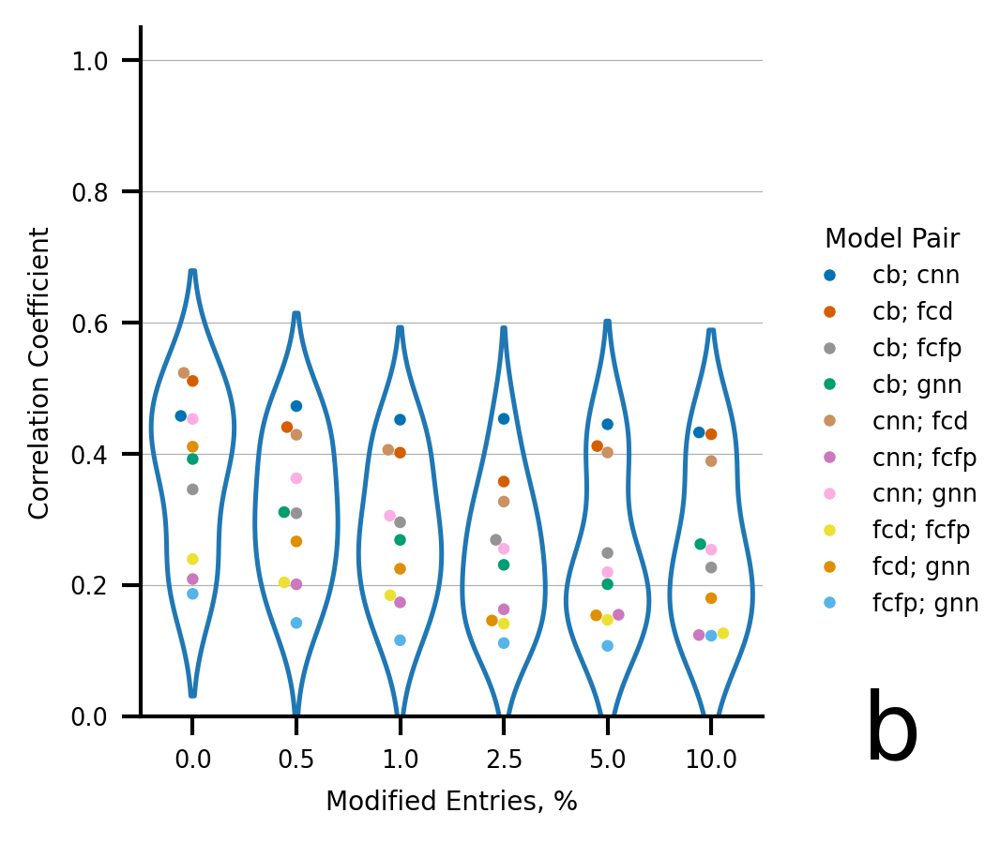

In [46]:
fg = plot_delta_correlations(
    shuffled_qm9_dfs, ref_data=base_qm9_df, s=3, height=3, aspect=1
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(3.5)
fg.figure.text(x=0.875, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S14b.eps")

Figure S15a


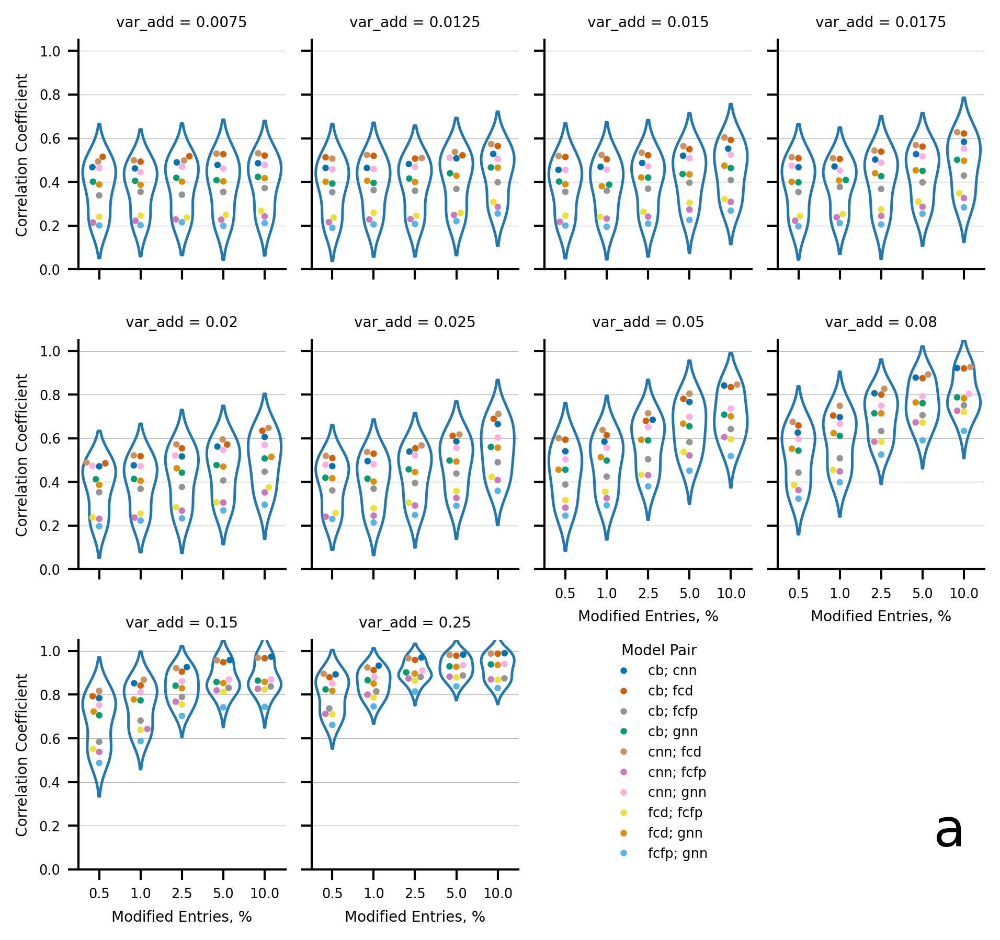

In [47]:
fg = plot_delta_correlations(variable_add_qm9_dfs, s=3, height=2, aspect=1, col_wrap=4)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="a", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15a.eps")

Figure S15b

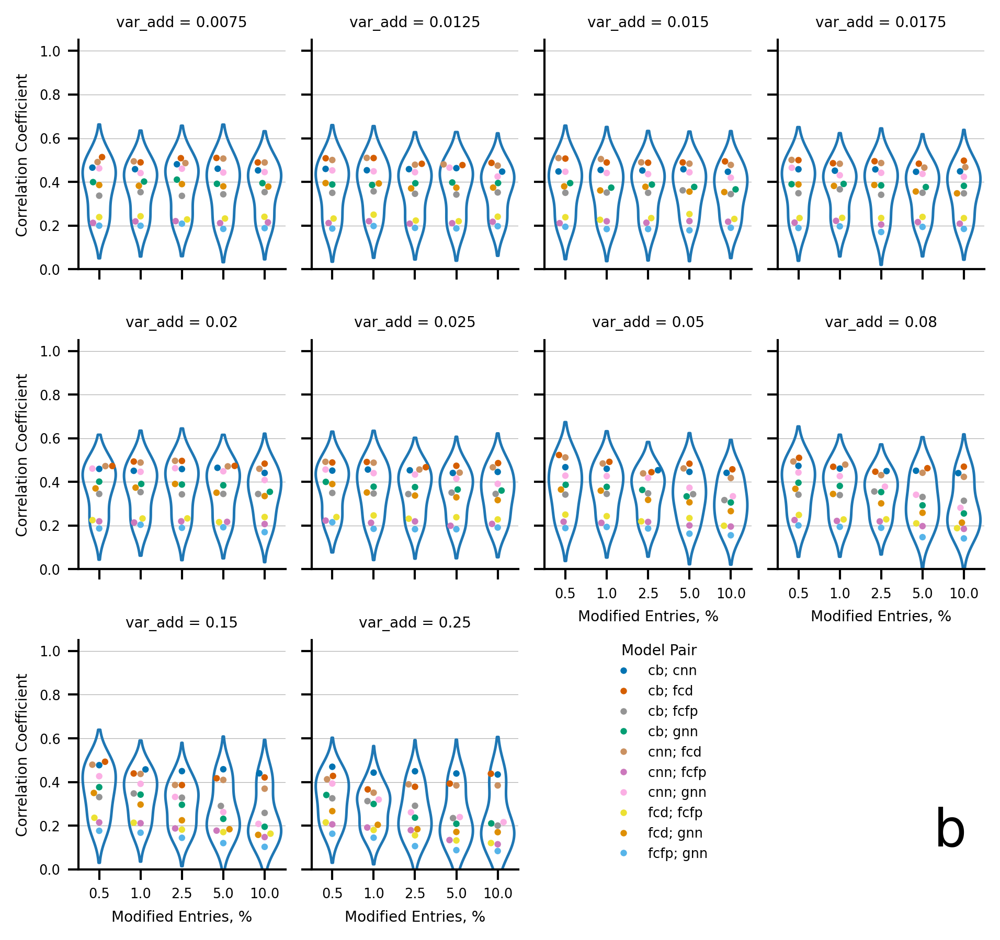

In [48]:
fg = plot_delta_correlations(
    variable_add_qm9_dfs, ref_data=base_qm9_df, s=3, height=2, aspect=1, col_wrap=4
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified Entries, %")
fg.set_ylabels("Correlation Coefficient")
fg.legend.set_title("Model Pair")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
sns.move_legend(fg, loc="center", bbox_to_anchor=(0.6, 0.2))
fg.figure.text(x=0.85, y=0.1, s="b", fontsize=24)
fg.tight_layout()
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S15b.eps")

Figure S16a


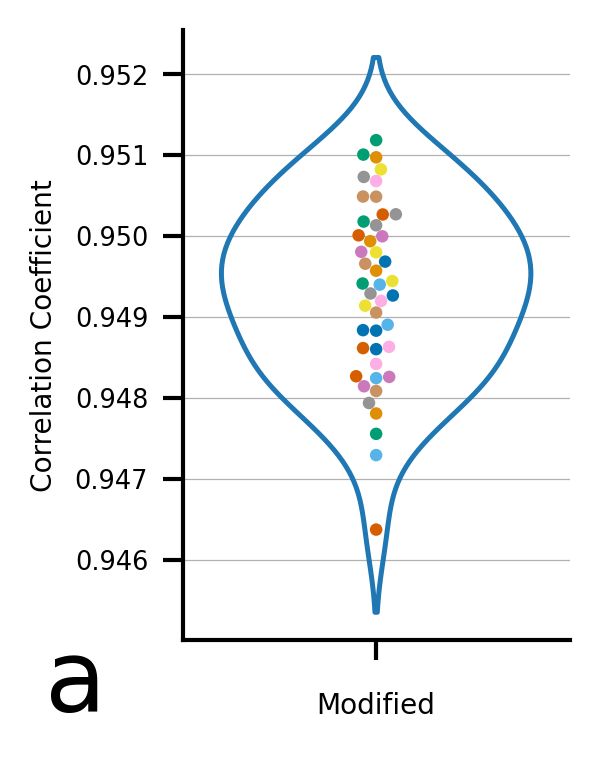

In [49]:
fg = plot_delta_correlations(
    gnn_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16a.eps")

Figure S16b

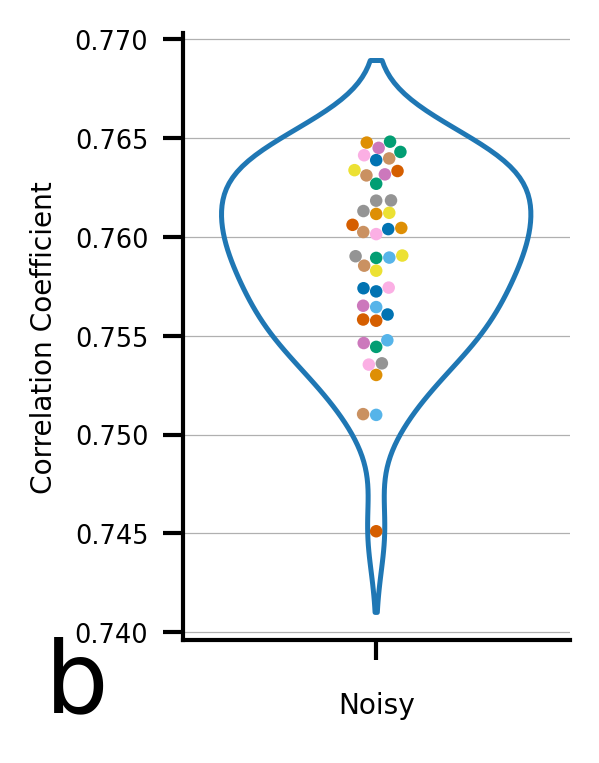

In [50]:
fg = plot_delta_correlations(
    gnn_df,
    ref_data=noisy_desc_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16b.eps")

Figure S16c

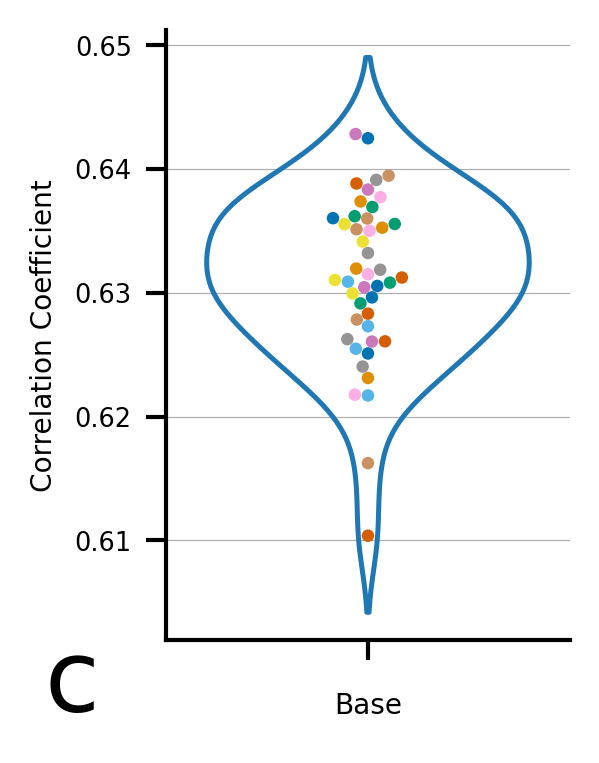

In [51]:
fg = plot_delta_correlations(
    gnn_df,
    ref_data=base_desc_df,
    model_names=gnn_models,
    x=None,
    s=3,
    height=2.5,
    aspect=0.75,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.set_dpi(300)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S16c.eps")

Figure S17a


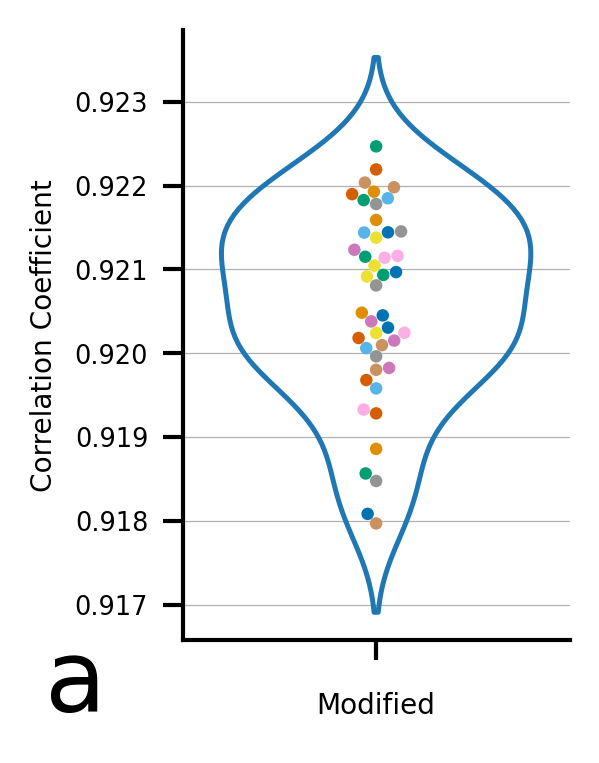

In [52]:
fg = plot_delta_correlations(
    fcfp_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Modified")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17a.eps")

Figure S17b

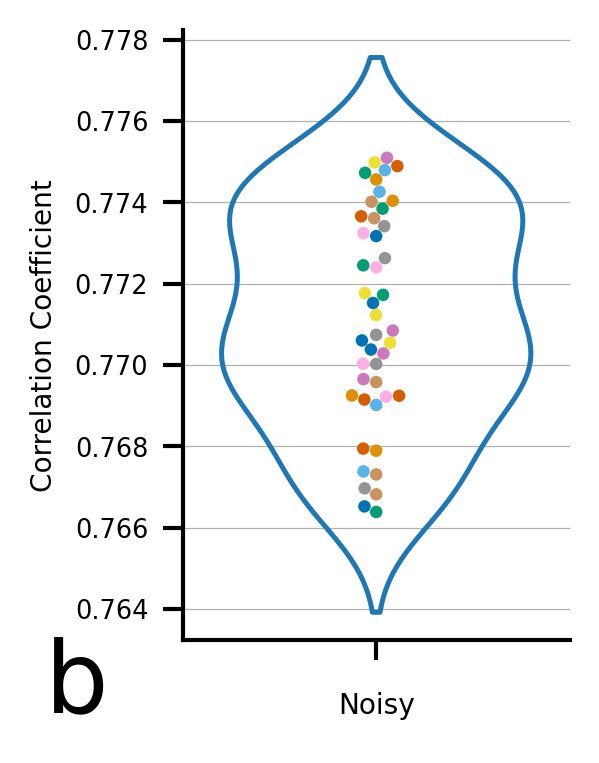

In [53]:
fg = plot_delta_correlations(
    fcfp_df,
    ref_data=noisy_desc_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Noisy")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_size_inches(2, 2.5)
fg.figure.set_dpi(300)
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17b.eps")

Figure S17c

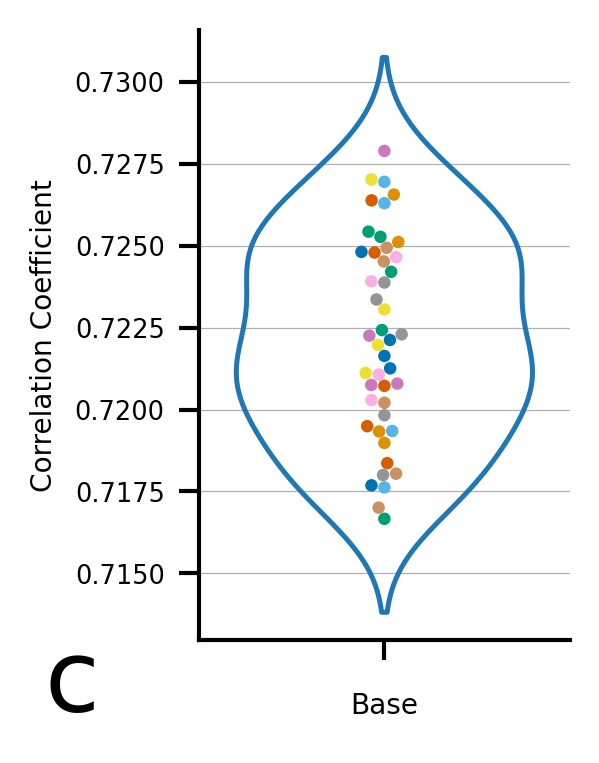

In [54]:
fg = plot_delta_correlations(
    fcfp_df,
    ref_data=base_desc_df,
    model_names=fcfp_models,
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("Base")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_size_inches(2, 2.5)
fg.figure.text(x=0.075, y=0.05, s="c", fontsize=24)
fg.tight_layout(rect=(0, 0, 1, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S17c.eps")

Figure S18


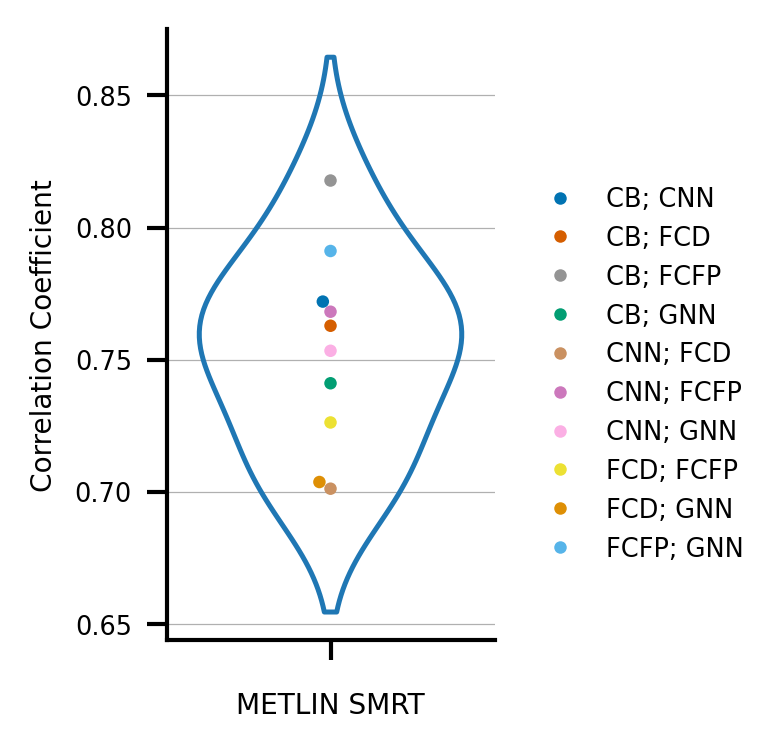

In [55]:
fg = plot_delta_correlations(
    metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("METLIN SMRT")
fg.set_ylabels("Correlation Coefficient")
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.7, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S18.eps")

Figure S19


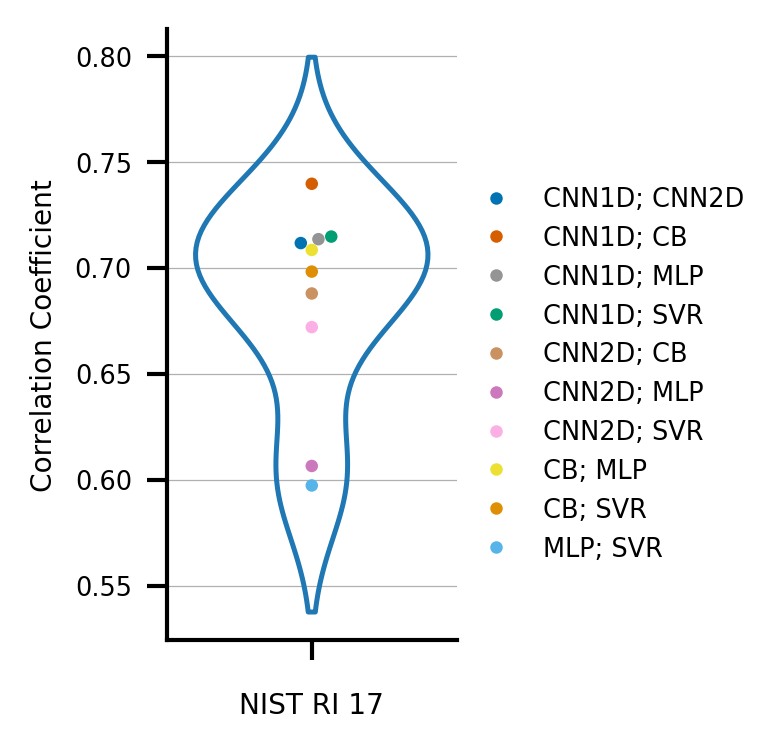

In [56]:
fg = plot_delta_correlations(
    nist_df,
    model_names=nist_models,
    value_name="RI_X",
    x=None,
    s=3,
    height=2.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(axis="y", linewidth=0.3)
    ax.set_axisbelow(True)
# fg.set(ylim=(0, 1.05))
fg.set_xlabels("NIST RI 17")
fg.set_ylabels("Correlation Coefficient")
handles, labels = fg.ax.get_legend_handles_labels()
new_labels = []
for label in labels:
    new_labels.append(
        label.replace("RI_", "").replace("1D", "CNN1D").replace("2D", "CNN2D")
    )
fg.legend.remove()
fg.figure.legend(handles=handles, labels=new_labels, loc="right", frameon=False)
# fg.legend.set_title("Model Pair")
# fg.legend.remove()
fg.figure.set_dpi(300)
fg.figure.set_figwidth(2.5)
fg.tight_layout(rect=(0, 0, 0.65, 1))
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.png", dpi=1000)
fg.figure.savefig(BASE_DIR / "reports/figures/Figure_S19.eps")

### Single Architecture Performance: A Comparison to Mixture of Models


In [57]:
gnn_data = calc_classification_metrics_multi_model(
    dataframe=gnn_df,
    ref_dataframe=noisy_desc_df,
    model_names=gnn_models,
    thresholds=np.geomspace(0.1, 100, 100),
)

fcfp_data = calc_classification_metrics_multi_model(
    dataframe=fcfp_df,
    ref_dataframe=noisy_desc_df,
    model_names=fcfp_models,
    thresholds=np.geomspace(0.1, 100, 100),
)

mix_data = calc_classification_metrics_multi_model(
    dataframe=shuffle_comp,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=np.geomspace(0.1, 100, 100),
)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Figure 3


In [58]:
gnn_data["models"] = "GNN"
mix_data["models"] = "MIX"
fcfp_data["models"] = "FCFP"
plot_data = pd.concat([gnn_data, fcfp_data, mix_data]).reset_index()[
    ["n_models", "threshold_%", "precision", "recall", "f1", "models"]
]
plot_data.columns = [
    "# Models",
    "threshold_%",
    "Precision",
    "Recall",
    "F1",
    "Models",
]

aucs = {
    "GNN": {},
    "FCFP": {},
    "MIX": {},
}

for i in range(1, 6):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "MIX"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["MIX"][i] = auc_val
    # print(i, auc_val)
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "GNN"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["GNN"][i] = auc_val
    # print(i, auc(xs, ys))
for i in range(1, 11):
    xs = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Recall"
    ].to_numpy()
    ys = plot_data.loc[
        (plot_data["# Models"] == i) & (plot_data["Models"] == "FCFP"), "Precision"
    ].to_numpy()
    # ys = ys[np.argsort(xs)]
    # xs = xs[np.argsort(xs)]
    auc_val = auc(xs, ys)
    aucs["FCFP"][i] = auc_val
    # print(i, auc(xs, ys))
aucs = pd.DataFrame(aucs)
aucs_plot = aucs.melt(
    var_name="Models", value_name="AUCPRC", ignore_index=False
).reset_index(names=["# Models"])
aucs_plot = aucs_plot.loc[np.isin(aucs_plot["# Models"], [1, 5, 10]), :]

[2.80925 3.     ]
[(<matplotlib.lines.Line2D object at 0x000002A030B34890>, 'Models'), (<matplotlib.lines.Line2D object at 0x000002A031FB90D0>, 'GNN'), (<matplotlib.lines.Line2D object at 0x000002A031856930>, 'FCFP'), (<matplotlib.lines.Line2D object at 0x000002A030E9BB60>, 'MIX'), (<matplotlib.lines.Line2D object at 0x000002A031FEA4E0>, '# Models'), (<matplotlib.lines.Line2D object at 0x000002A02EA55C70>, '1'), (<matplotlib.lines.Line2D object at 0x000002A02EA562D0>, '5'), (<matplotlib.lines.Line2D object at 0x000002A02E8D5520>, '10')]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


array([4.05320669, 3.        ])

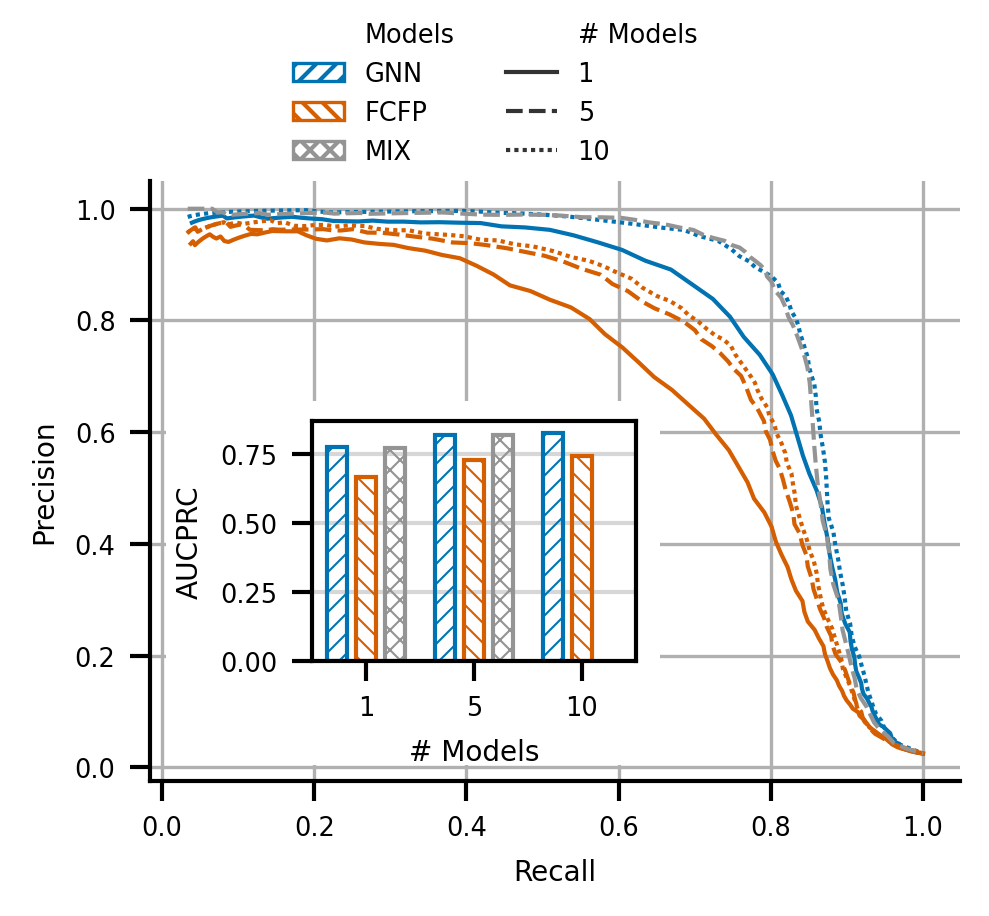

In [59]:
fg = sns.relplot(
    plot_data[
        ((plot_data["Models"] == "MIX") & (plot_data["# Models"] == 5))
        | (np.isin(plot_data["# Models"], [1, 10]) & (plot_data["Models"] == "GNN"))
        | (np.isin(plot_data["# Models"], [1, 5, 10]) & (plot_data["Models"] == "FCFP"))
    ],
    y="Precision",
    x="Recall",
    hue="Models",
    style="# Models",
    kind="line",
    markers=False,
    lw=1,
    height=3,
    aspect=0.7,
    palette="colorblind_reordered",
)
for ax in fg.axes.flatten():
    ax.grid(True)

print(fg.figure.get_size_inches())
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.85))

ax = fg.axes[0, 0]
axins = ax.inset_axes(
    (0.2, 0.2, 0.4, 0.4), frameon=True, facecolor="white", alpha=1, zorder=6
)
axins.grid(axis="y", lw=1, alpha=0.5)
axins.set_axisbelow(True)
bp = sns.barplot(
    data=aucs_plot,
    x="# Models",
    y="AUCPRC",
    hue="Models",
    palette="colorblind_reordered",
    ax=axins,
    legend=False,
    fill=False,
    dodge=True,
    gap=0.3,
    linewidth=1,
)

for patch in axins.patches:
    patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
    patch.set_hatch_linewidth(0.5)


ax.add_patch(
    Rectangle(
        (0.005, 0.005), 0.65, 0.65, facecolor="white", edgecolor=None, zorder=5
    )
)
handles, labels = fg.axes[0, 0].get_legend_handles_labels()
print(list(zip(handles, labels)))
patches = [
    (
        Patch(
            facecolor="white",
            edgecolor=h.get_color(),
            label=l,
            hatch=HATCH_DICT.get(h.get_color(), "****"),
            hatch_linewidth=0.5,
        )
        if str(l).isupper()
        else h
    )
    for (h, l) in zip(handles, labels)
]
fg.legend.remove()
fg.add_legend(handles=patches)
sns.move_legend(fg, "upper center", ncols=2)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_3.eps")
np.array(fg.figure.get_size_inches())

### Distribution of Entries across Groups


Figure 4


[3.34645669 2.        ]


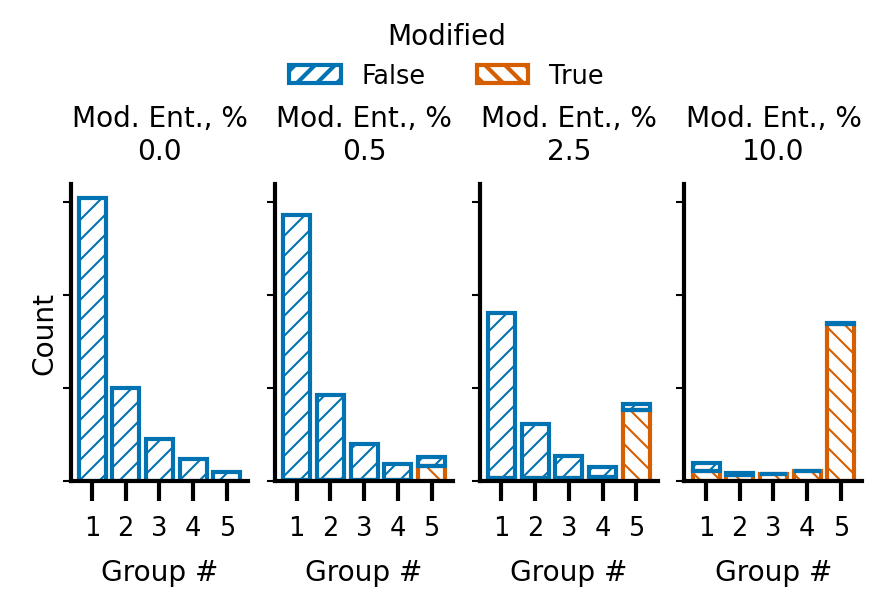

In [62]:
plot_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
ground_truth = get_modified_entries(
    data=shuffled_desc_dfs, ref_data=noisy_desc_df
).to_frame("modified")
plot_df = plot_df.join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df.reset_index().drop(
    columns=["threshold_%", "data_offset", "s_5_a", "s_5_r", "s_5_n"]
)
plot_df.columns = ["Mod. Ent., %", "#", "Modified", "Group #"]
plot_df = plot_df.loc[np.isin(plot_df["Group #"], np.arange(1, 6)), :]
plot_df = plot_df.loc[np.isin(plot_df["Mod. Ent., %"], [0, 0.5, 2.5, 10]), :]
fg = sns.displot(
    data=plot_df,
    x="Group #",
    col="Mod. Ent., %",
    hue="Modified",
    kind="hist",
    fill=False,
    shrink=0.8,
    element="bars",
    multiple="stack",
    discrete=True,
    linewidth=1,
    height=2,
    aspect=0.3,
    palette="colorblind_reordered",
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


fg.set_titles(
    row_template="{row_var}\n{row_name}", col_template="{col_var}\n{col_name}"
)
sns.move_legend(fg, "upper center", ncols=3)
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.set_yticklabels([])
fg.set(xticks=(np.arange(1, 6).astype(int)))
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)
fg.set(
    ylim=(
        0,
        1.05
        * plot_df.loc[plot_df["Group #"] == 1, :]
        .groupby(["Mod. Ent., %", "Group #"])
        .size()
        .max(),
    )
)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_4.eps")
print(fg.figure.get_size_inches())

Figure S20


[7.08661417 8.75      ]


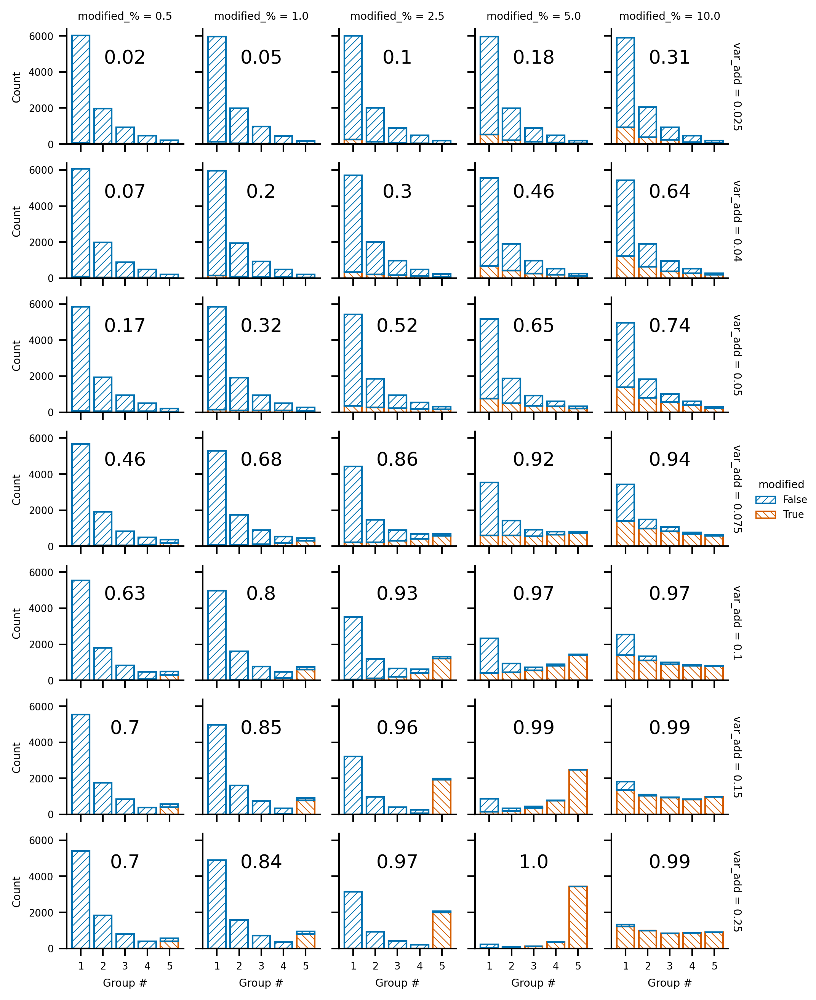

In [63]:
fg = plot_group_sizes(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )
fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S20.eps")
print(fg.figure.get_size_inches())

Figure S21


[7.08661417 2.        ]


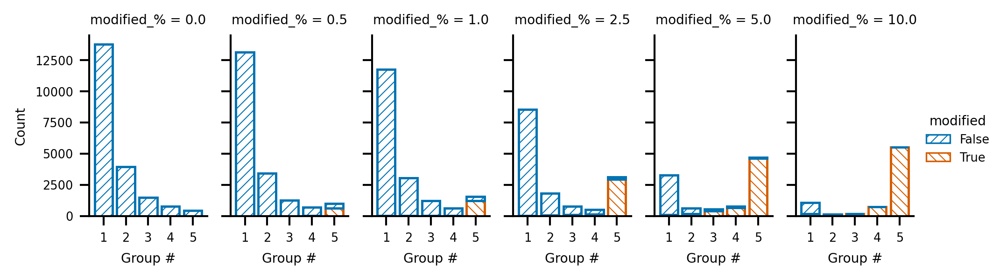

In [64]:
fg = plot_group_sizes(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row=None,
    height=2,
    aspect=0.75,
    add_catplot=False,
    plot_type="histplot",
)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(180 / 25.4)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S21.eps")
print(fg.figure.get_size_inches())

Figure S22


[ 7. 10.]


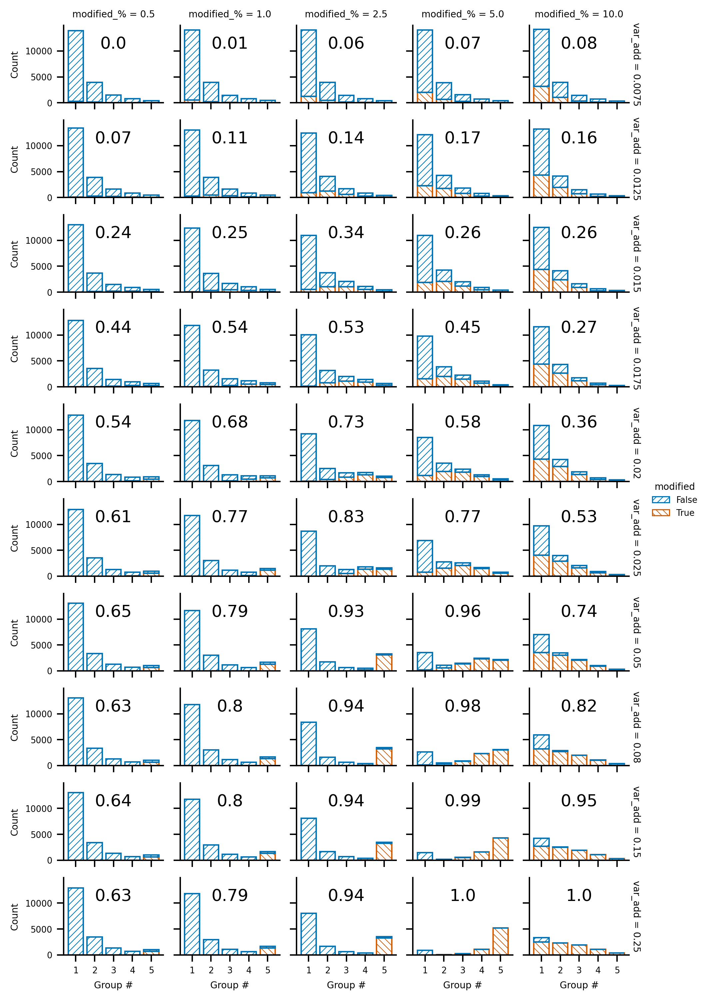

In [65]:
fg = plot_group_sizes(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    groups=np.arange(1, 6),
    group_stat="both",
    hue="modified",
    col="modified_%",
    row="var_add",
    height=1.25,
    aspect=1,
    add_catplot=False,
    plot_type="histplot",
    margin_titles=True,
)

plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.7,
            transform=ax.transAxes,
            fontdict={"fontsize": 12},
            ha="center",
        )

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 10)
fg.tight_layout(rect=(0, 0, 0.93, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S22.eps")
print(fg.figure.get_size_inches())

Figure S23a


[3. 3.]


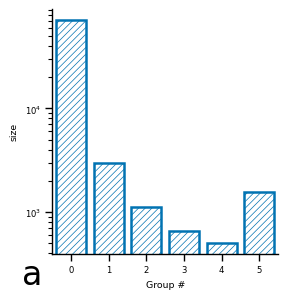

In [66]:
fg = plot_group_sizes(
    dataframe=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    height=3,
    aspect=0.75,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="a", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23a.eps")
print(fg.figure.get_size_inches())

Figure S23b


[3. 3.]


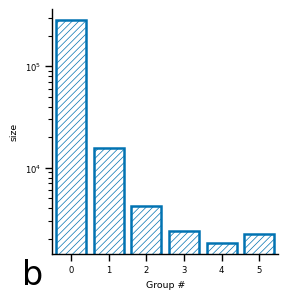

In [67]:
fg = plot_group_sizes(
    dataframe=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    thresholds=DEFAULT_THRESHOLD,
    add_catplot=False,
    group_stat="both",
    plot_type="barplot",
    col=None,
    row=None,
    hue=None,
    aspect=0.75,
    height=3,
)
for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)


handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)

fg.set(yscale="log")
fg.set_xlabels("Group #")
fg.figure.text(x=0.075, y=0.05, s="b", fontsize=24)
fg.figure.set_size_inches(3,3)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S23b.eps")
print(fg.figure.get_size_inches())

### Standard Deviation of Predictions as a Function of Group Number

Figure 5


[3.34645669 3.75      ]


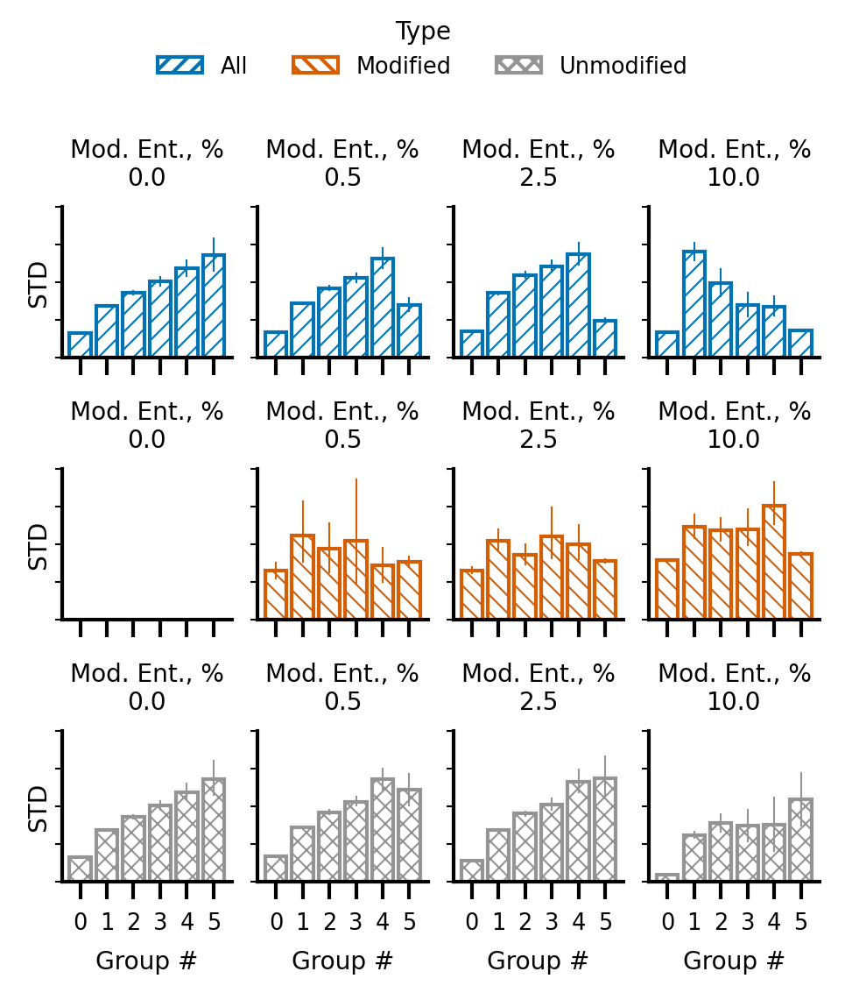

In [68]:
group_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
basic_df = calc_basic_stats(
    dataframe=shuffled_desc_dfs,
)
ground_truth = get_modified_entries(data=shuffled_desc_dfs, ref_data=noisy_desc_df)
plot_df = group_df.join(basic_df).join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df[["s_5_b","p_std"]]
all_df = plot_df.copy()
mod_df = plot_df.xs(True, level="modified", drop_level=False)
unmod_df = plot_df.xs(False, level="modified", drop_level=False)
# plot_df = plot_df.droplevel(level=["modified", "threshold_%","data_offset"])
plot_df = pd.concat(
    {
        "All": all_df,
        "Modified": mod_df,
        "Unmodified": unmod_df,
        #  "Unmodified": unmod_df
    },
    names=["Type"],
).reset_index()
plot_df = plot_df[["Type","modified_%","s_5_b","p_std"]]
plot_df = plot_df.iloc[np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])]
plot_df.columns = ["Type", "Mod. Ent., %", "Group #", "STD"]
fg = sns.catplot(
    data=plot_df,
    x="Group #",
    y="STD",
    hue="Type",
    row="Type",
    kind="bar",
    col="Mod. Ent., %",
    fill=False,
    native_scale=True,
    dodge=False,
    # gap=0.4,
    palette="colorblind_reordered",
    linewidth=1,
    err_kws={"lw": 0.5},
    height=1.25,
    aspect=1,
    sharey=False,
)

for ax in fg.axes.flatten():
    for patch in ax.patches:
        patch.set_hatch(HATCH_DICT[patch.get_edgecolor()[:-1]])
        patch.set_hatch_linewidth(0.5)

handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])
    handle.set_hatch_linewidth(0.5)


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var}\n{col_name}")
fg.figure.set_figwidth(85 / 25.4)
fg.tight_layout(rect=(0, 0, 1, 0.9))
fg.figure.set_dpi(300)
fg.figure.subplots_adjust(wspace=0.15)
fg.set_ylabels(labelpad=0)
fg.tick_params(axis="y", pad=1, width=0.5, length=2)

fg.savefig(BASE_DIR / "reports/figures/Figure_5.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_5.eps")

print(fg.figure.get_size_inches())

Figure 6


[3.34645669 4.        ]


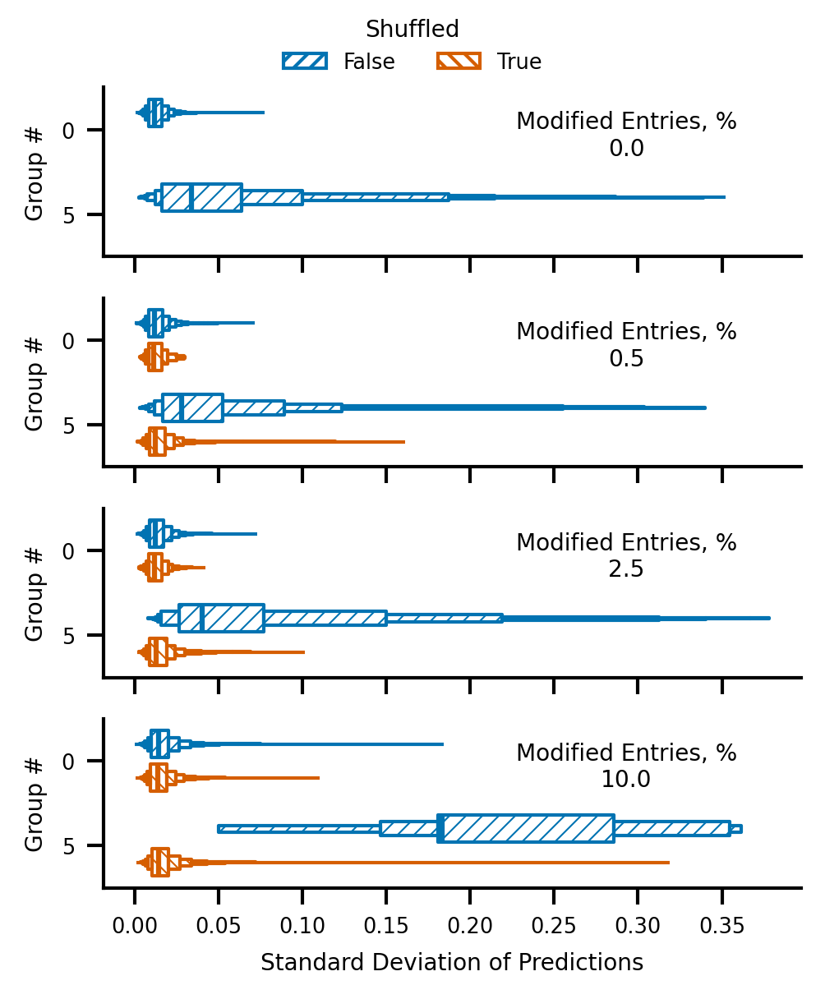

In [69]:
group_df = calc_groups(
    dataframe=shuffled_desc_dfs,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
)
basic_df = calc_basic_stats(
    dataframe=shuffled_desc_dfs,
)
ground_truth = get_modified_entries(data=shuffled_desc_dfs, ref_data=noisy_desc_df)
plot_df = group_df.join(basic_df).join(ground_truth)
plot_df = plot_df.set_index("modified", append=True)
plot_df = plot_df[["s_5_b","p_std"]]
plot_df = plot_df.reset_index()
plot_df = plot_df[["modified_%","#","modified","s_5_b","p_std"]]
plot_df = plot_df.loc[
    (np.isin(plot_df["s_5_b"], [0, 5]))
    & (np.isin(plot_df["modified_%"], [0, 0.5, 2.5, 10])),
    :,
]
plot_df.columns = [
    "Modified Entries, %",
    "#",
    "Shuffled",
    "Group #",
    "Standard Deviation of Predictions",
]
fg = sns.catplot(
    data=plot_df,
    y="Group #",
    x="Standard Deviation of Predictions",
    row="Modified Entries, %",
    hue="Shuffled",
    kind="boxen",
    orient="h",
    palette="colorblind_reordered",
    showfliers=False,
    k_depth="full",
    dodge=True,
    gap=0.2,
    # k_depth=5,
    fill=False,
    height=1,
    aspect=3,
    lw=1,
)

fg.set_titles(row_template="{row_var}\n{row_name}")
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    ax.text(
        s=ax.get_title(),
        x=0.75,
        y=0.6,
        transform=ax.transAxes,
        ha="center",
        fontdict={"fontsize": ax.title.get_fontsize()},
    )
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)
fg.set_titles(template="")
handles = fg.legend.legend_handles
for handle in handles:
    handle.set_hatch(HATCH_DICT[handle.get_edgecolor()[:-1]])


sns.move_legend(fg, "upper center", ncols=2)
fg.figure.set_figwidth(85 / 25.4)
# plt.subplots_adjust(right=0.9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_6.eps")
print(fg.figure.get_size_inches())

Figure S24


[7. 9.]


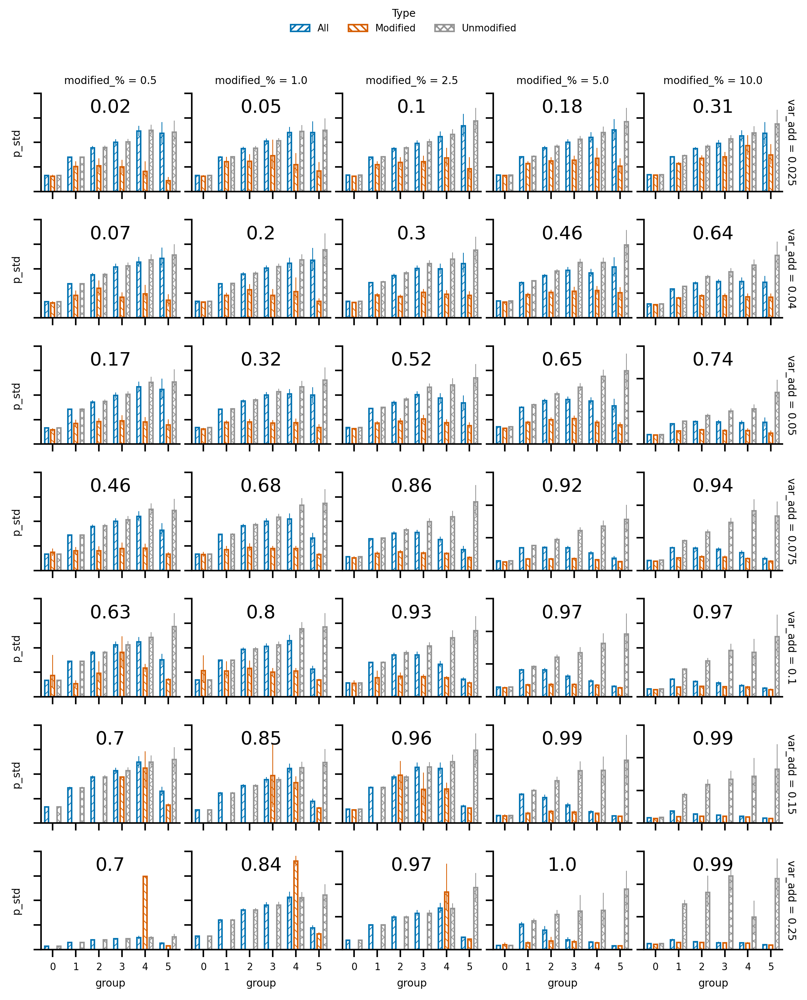

In [71]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24.eps")
print(fg.figure.get_size_inches())

[7. 9.]


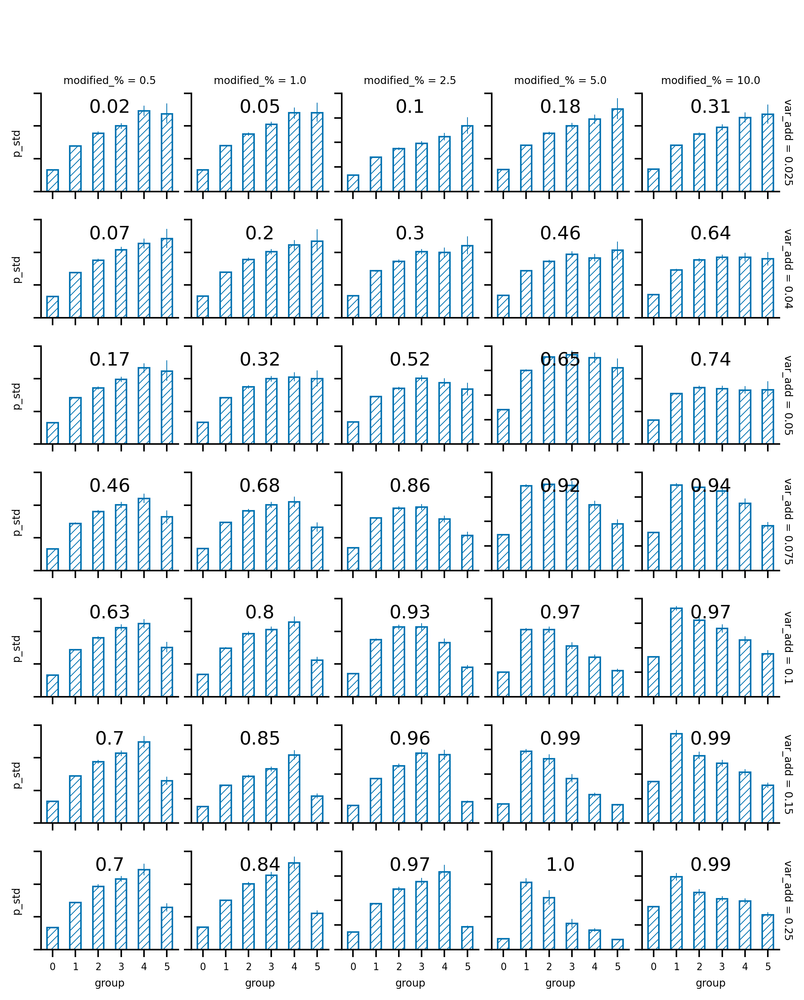

In [72]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    mod_df_reference=True,
    split_modified=False,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue=None,
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_desc_dfs,
    ref_dataframe=noisy_desc_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)
# display(precisions)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )


sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24-s.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S24-s.eps")
print(fg.figure.get_size_inches())

Figure S25


[7. 5.]


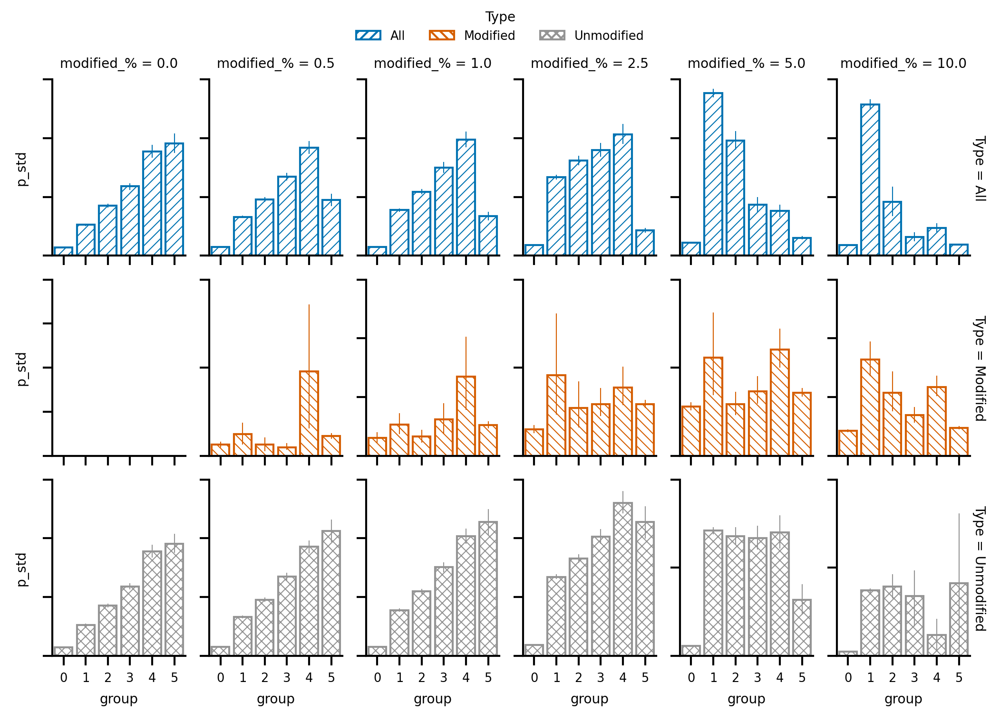

In [73]:
fg = plot_stats_group(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="Type",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=False,
)
sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_size_inches(7, 5)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.figure.set_dpi(300)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S25.eps")
print(fg.figure.get_size_inches())

Figure S26


[7. 9.]


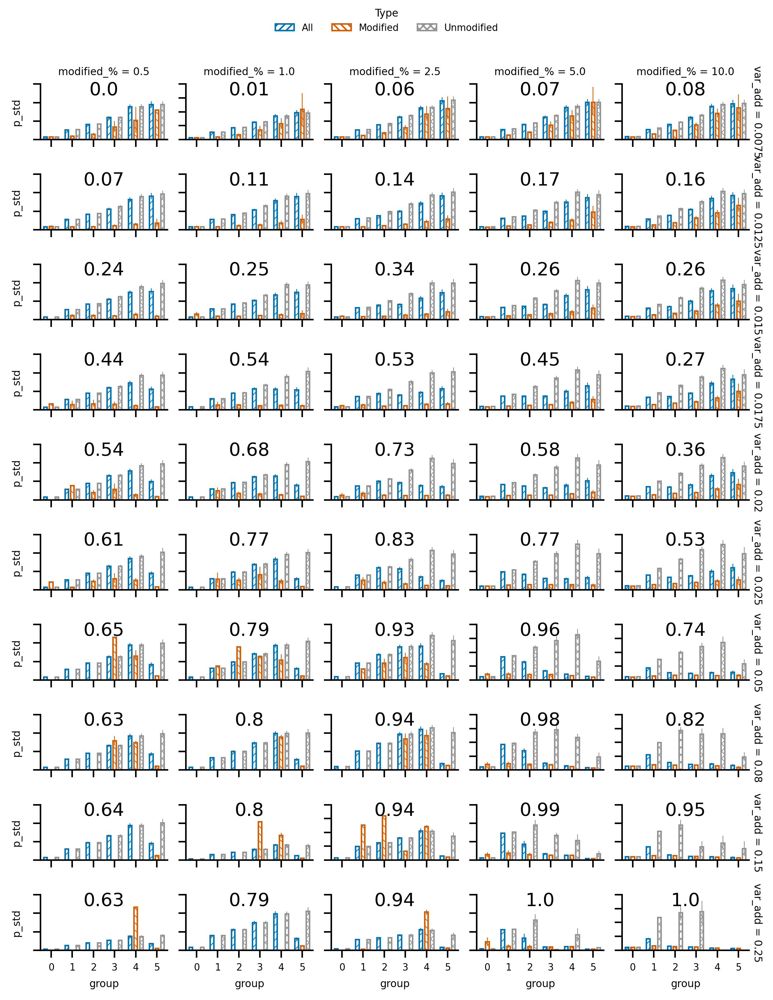

In [74]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=True,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue="Type",
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )

sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S26.eps")
print(fg.figure.get_size_inches())

[7. 9.]


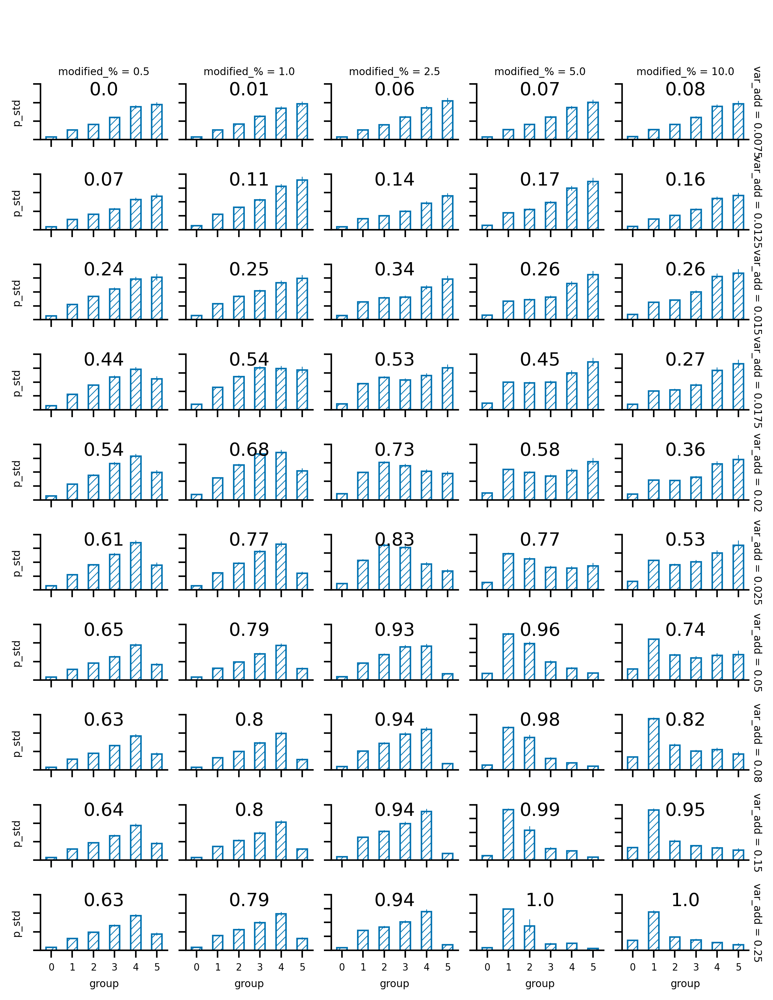

In [75]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    mod_df_reference=True,
    split_modified=False,
    groups=np.arange(0, 6),
    group_stat="both",
    stats="p_std",
    kind="barplot",
    x_var="group",
    y_var="p_std",
    row="var_add",
    col="modified_%",
    hue=None,
    annot_sizes=False,
    height=1,
    aspect=2,
    margin_titles=True,
    dodge=True,
)
plot_df = calc_classification_metrics(
    dataframe=variable_add_qm9_dfs,
    ref_dataframe=base_qm9_df,
    model_names=MODEL_NAMES,
    thresholds=DEFAULT_THRESHOLD,
    data_offsets=DEFAULT_DATA_OFFSET,
    group_stat="both",
    recursive=False,
)
precisions = (
    plot_df.xs(5, level="group_#")["precision"].unstack(1).sort_index().round(2).T
)

for i, row in enumerate(fg.axes):
    for j, ax in enumerate(row):
        # print(axs)
        ax.text(
            s=precisions.to_numpy()[i, j],
            x=0.5,
            y=0.8,
            transform=ax.transAxes,
            ha="center",
            fontsize=12,
        )

sns.move_legend(fg, "upper center", ncols=3)
fg.set_yticklabels(())
fg.set(xticks=np.arange(0, 6).astype(int))
fg.set_titles(template="{col_var} = {col_name}\n{row_var} = {row_name}")
fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 1.0, 0.95))
fg.savefig(BASE_DIR / "reports/figures/Figure_S26-s.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S26-s.eps")
print(fg.figure.get_size_inches())

Figure S27

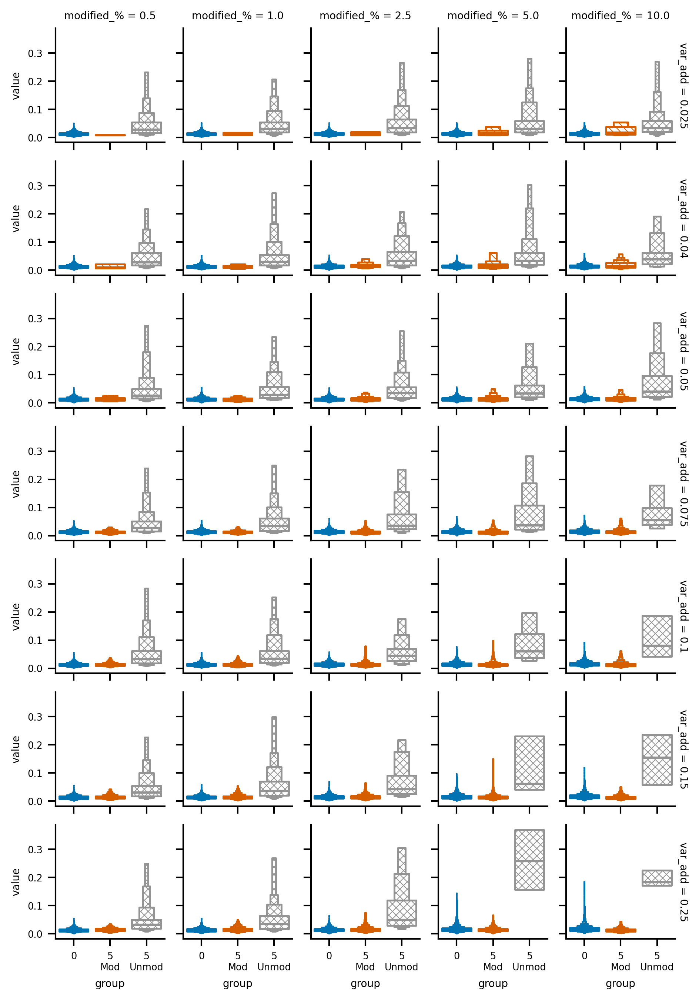

In [76]:
fg = plot_stats_group(
    dataframe=variable_add_desc_dfs,
    model_names=MODEL_NAMES,
    ref_data=noisy_desc_df,
    stats="p_std",
    row="var_add",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)

for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S27.eps")

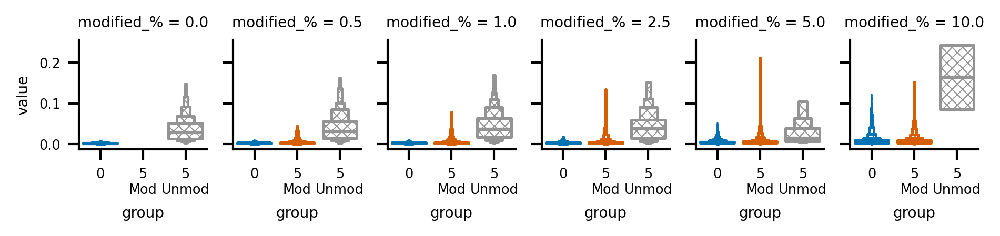

In [77]:
fg = plot_stats_group(
    dataframe=shuffled_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S28.eps")

Figure S29


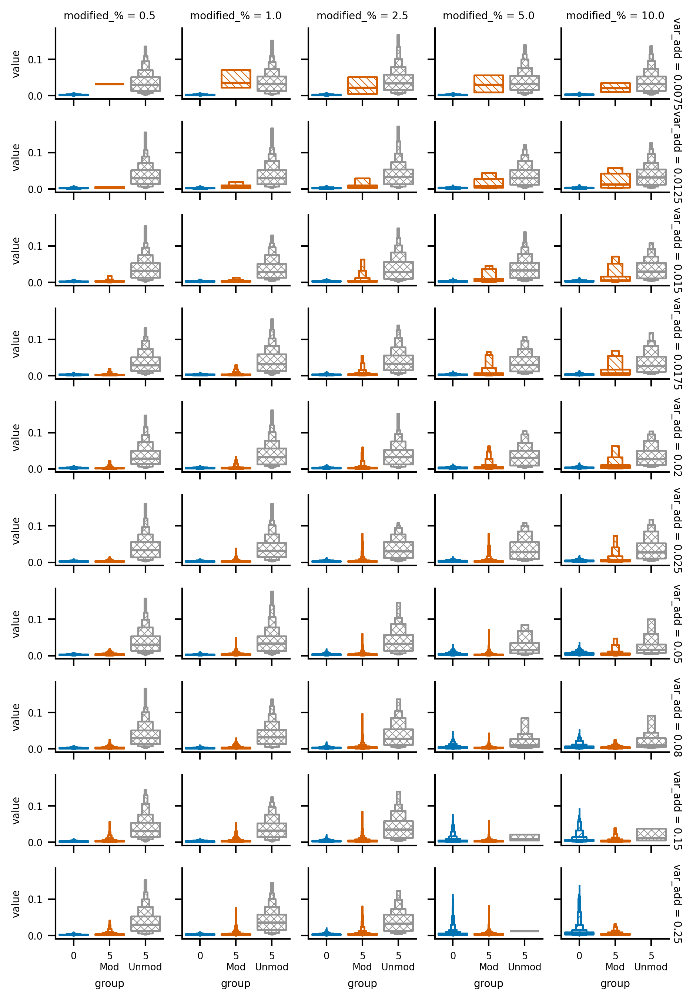

In [78]:
fg = plot_stats_group(
    dataframe=variable_add_qm9_dfs,
    model_names=MODEL_NAMES,
    ref_data=base_qm9_df,
    row="var_add",
    stats="p_std",
    mod_df_reference=True,
    split_modified="last",
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    kind="catplot",
    hue="group",
    height=1.5,
    aspect=1,
    annot_sizes=False,
    margin_titles=True,
)
for ax in fg.axes.flatten():
    # ax.title.set_position((1.05, 0))
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.figure.set_dpi(300)
fg.figure.set_size_inches(7, 9)
fg.tight_layout(rect=(0, 0, 0.9, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S29.eps")

Figure S30


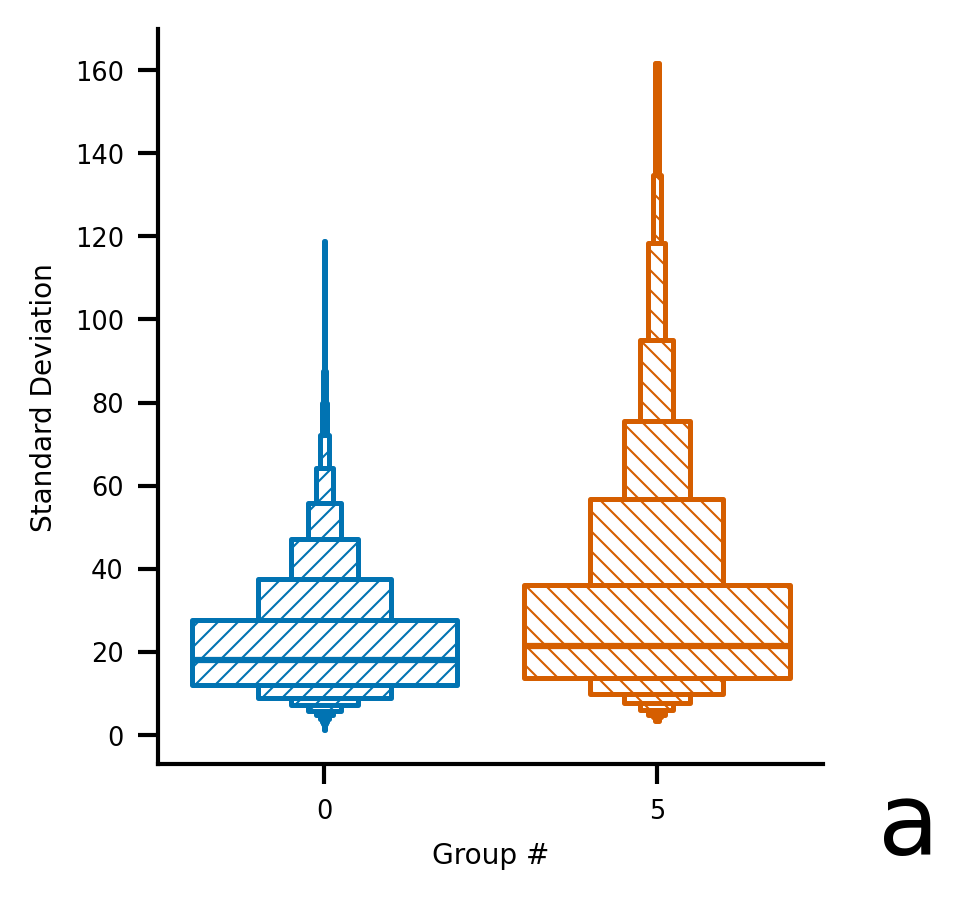

In [79]:
fg = plot_stats_group(
    dataframe=metlin_df,
    model_names=metlin_models,
    value_name="EXP",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30a.eps")

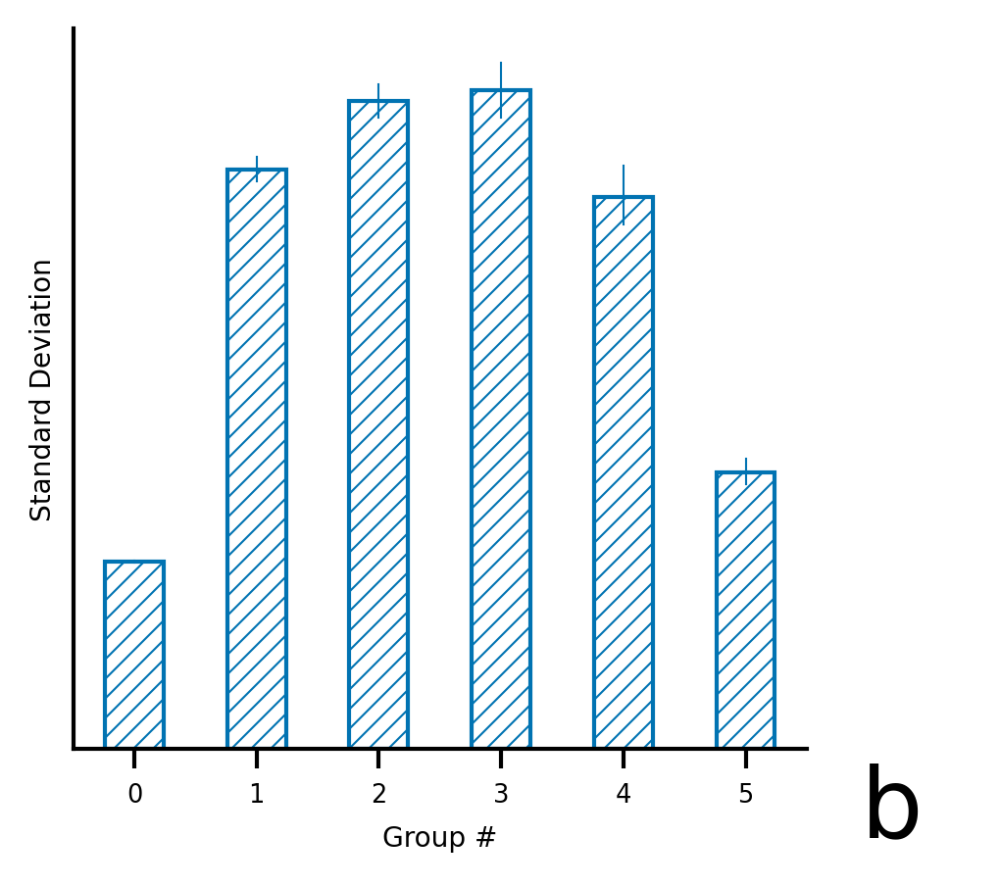

In [80]:
fg = plot_stats_group(
    dataframe=metlin_df,
    model_names=metlin_models,
    ref_data=None,
    value_name="EXP",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S30b.eps")

Figure S31


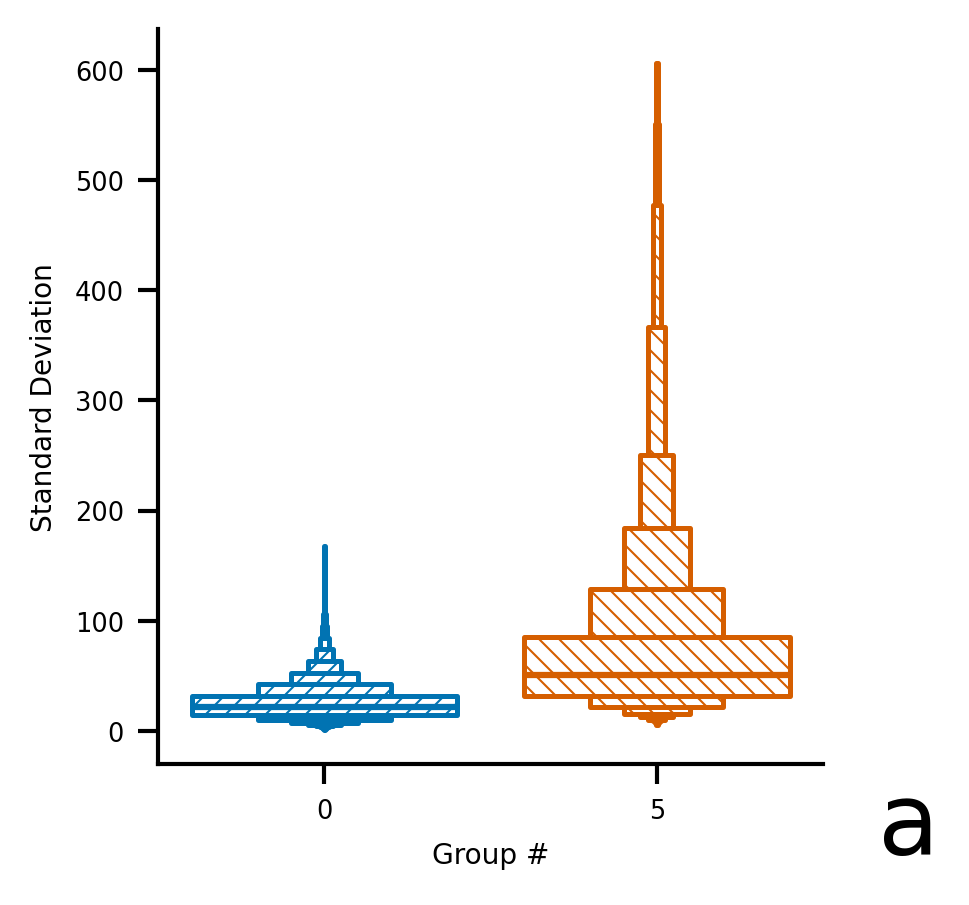

In [81]:
fg = plot_stats_group(
    dataframe=nist_df,
    model_names=nist_models,
    value_name="RI_X",
    stats="p_std",
    mod_df_reference=True,
    split_modified=False,
    group_stat="both",
    data_offset=DEFAULT_DATA_OFFSET,
    thresholds=DEFAULT_THRESHOLD,
    groups=[0, 5],
    x_var="group",
    hue="group",
    col=None,
    row=None,
    annot_sizes=False,
    height=3,
    aspect=1,
)
for ax in fg.axes.flatten():
    # print("Ax: ", ax)
    # ax.text(
    #     s=ax.get_title(),
    #     x=0.75,
    #     y=0.6,
    #     transform=ax.transAxes,
    #     ha="center",
    #     fontdict={"fontsize": ax.title.get_fontsize()},
    # )
    # ax.title.set_position((1.05, 0))
    ax.set_xlabel("")
    for collection in ax.collections:
        # print("\tCollection: ", collection, collection.get_edgecolor().flatten())
        for path in collection.get_paths():
            patch = PathPatch(
                path,
                facecolor=None,
                edgecolor=collection.get_edgecolor(),
                fill=False,
                hatch=HATCH_DICT[tuple(collection.get_edgecolor().flatten()[:-1])],
                hatch_linewidth=0.5,
                lw=0.5,
            )
            ax.add_patch(patch)

fg.set_xlabels("Group #")
fg.figure.set_dpi(300)
fg.figure.set_figwidth(85 / 25.4)
fg.set_ylabels("Standard Deviation")
fg.figure.text(x=0.875, y=0.05, s="a", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31a.eps")

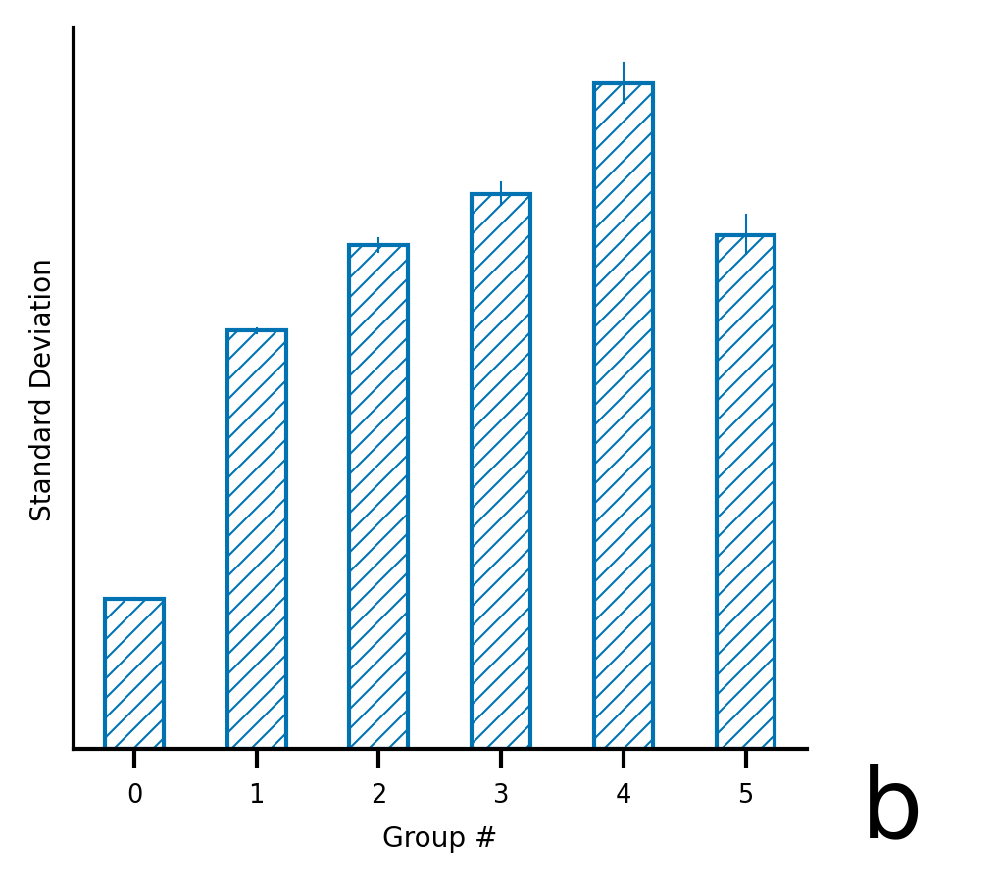

In [82]:
fg = plot_stats_group(
    dataframe=nist_df,
    model_names=nist_models,
    ref_data=None,
    value_name="RI_X",
    stats="p_std",
    groups=np.arange(0, 6),
    mod_df_reference=True,
    kind="barplot",
    relplot_agg=True,
    x_var="group",
    y_var="p_std",
    hue=None,
    col=None,
    row=None,
    split_modified=False,
    annot_sizes=False,
    facet_kws=dict(sharey=False),
)
fg.figure.set_dpi(300)
fg.set_xlabels("Group #")
fg.set_ylabels("Standard Deviation")
fg.set(yticks=())
fg.figure.set_figwidth(85 / 25.4)
fg.figure.text(x=0.875, y=0.05, s="b", fontsize=24)
fg.tight_layout(rect=(0, 0, 0.85, 1))
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S31b.eps")
### "Yellow cards" vs Simple Thresholding


### Comparing Yellow Cards vs Quantile Thresholding

Figure S32


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


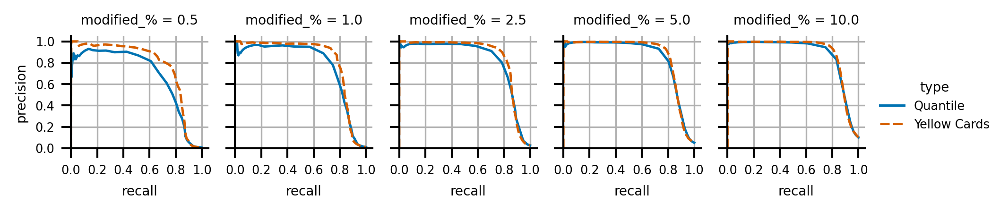

In [83]:
results = compare_threshold_methods(dataframe=shuffled_desc_dfs, ref_data=noisy_desc_df)
results = results.sort_index(level="type").reset_index()
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S32.eps")

Table 2


In [84]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))

    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0   0.000        0.000
0.5   0.689        0.776
1.0   0.775        0.820
2.5   0.825        0.853
5.0   0.851        0.865
10.0  0.879        0.890

Figure S34


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


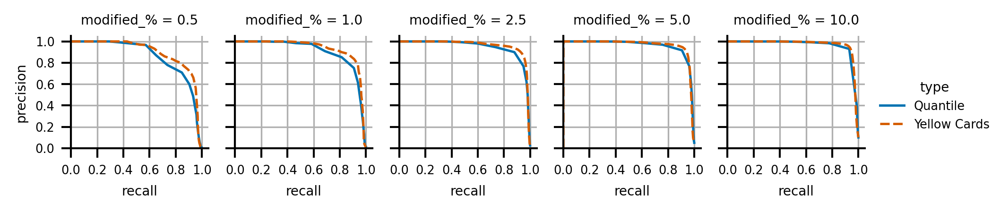

In [85]:
results = compare_threshold_methods(dataframe=shuffled_qm9_dfs, ref_data=base_qm9_df).sort_index(level="type").reset_index()
fg = sns.relplot(
    data=results.loc[results["modified_%"] > 0],
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.figure.set_figwidth(7)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S33.eps")

Table 2

In [86]:
auc_results = []
for i in results["modified_%"].unique():
    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "recall"
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Yellow Cards"), "precision"
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "yellow cards", round(auc(xs, ys), 3)))


    xs = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "recall",
    ].to_numpy()
    ys = results.loc[
        (results["modified_%"] == i) & (results["type"] == "Quantile"),
        "precision",
    ].to_numpy()
    ys = ys[np.argsort(xs)]
    xs = xs[np.argsort(xs)]
    auc_results.append((i, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1]).unstack(1)
plot_df

2             
1     quant yellow cards
0                       
0.0   0.000        0.000
0.5   0.859        0.893
1.0   0.904        0.931
2.5   0.945        0.960
5.0   0.957        0.963
10.0  0.962        0.969

Figure S34

In [119]:
results = compare_threshold_methods(
    dataframe=variable_add_desc_dfs, ref_data=noisy_desc_df, num_points=100
)
results

modified                                   precision  recall        f1
threshold var_add modified_% type                                     
0.0001    0.025   0.5        Yellow Cards   0.000000     0.0  0.000000
                  1.0        Yellow Cards   0.000000     0.0  0.000000
                  2.5        Yellow Cards   0.000000     0.0  0.000000
                  5.0        Yellow Cards   0.000000     0.0  0.000000
                  10.0       Yellow Cards   0.000000     0.0  0.000000
...                                              ...     ...       ...
100.0000  0.250   0.5        Yellow Cards   0.004995     1.0  0.009940
                  1.0        Yellow Cards   0.009989     1.0  0.019781
                  2.5        Yellow Cards   0.024998     1.0  0.048778
                  5.0        Yellow Cards   0.049997     1.0  0.095232
                  10.0       Yellow Cards   0.100006     1.0  0.181829

[6965 rows x 3 columns]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


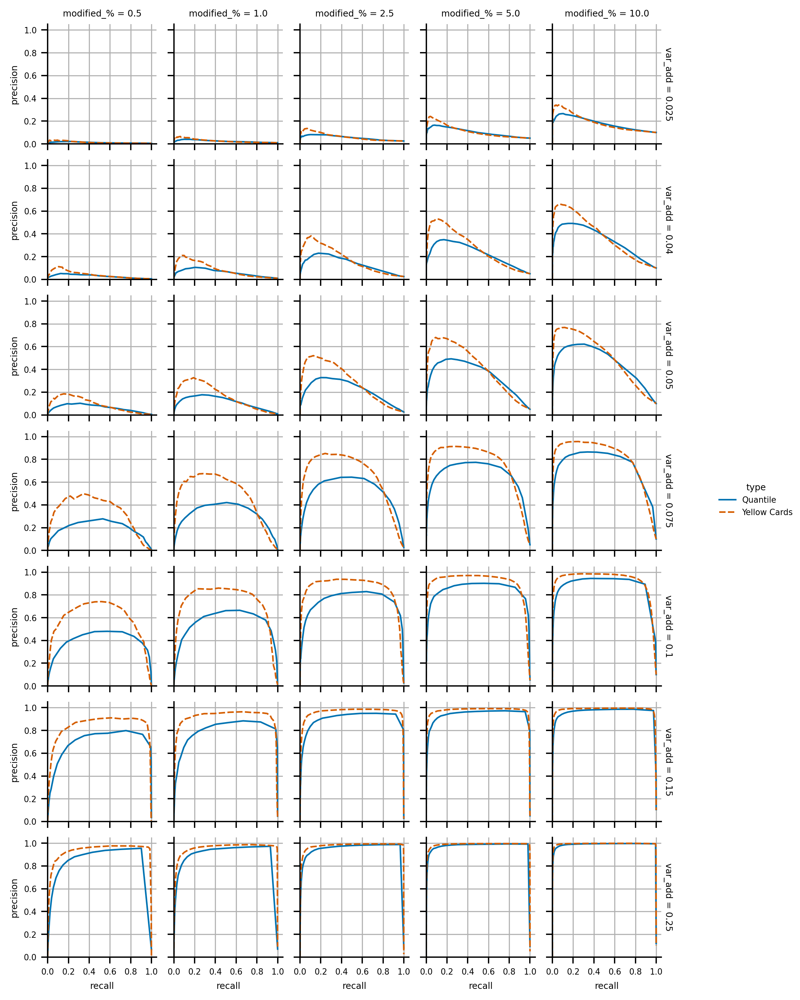

In [120]:
fg = sns.relplot(
    data=results.sort_index(level="type").reset_index(),
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    row="var_add",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
    facet_kws={"margin_titles": True},
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S34.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S34.eps")

In [121]:
auc_results = []
for i in results.index.get_level_values("modified_%").unique():
    for j in results.index.get_level_values("var_add").unique():
        xs = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Yellow Cards", level="type")["recall"]
            .to_numpy()
        )
        ys = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Yellow Cards", level="type")["precision"]
            .to_numpy()
        )
        ys = ys[np.argsort(xs)]
        xs = xs[np.argsort(xs)]
        auc_results.append((i, j, "yellow cards", round(auc(xs, ys), 3)))

        xs = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Quantile", level="type")["recall"]
            .to_numpy()
        )
        ys = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Quantile", level="type")["precision"]
            .to_numpy()
        )
        ys = ys[np.argsort(xs)]
        xs = xs[np.argsort(xs)]
        auc_results.append((i, j, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1, 2]).unstack(2)
plot_df

3             
2           quant yellow cards
0    1                        
0.5  0.025  0.012        0.014
     0.040  0.028        0.041
     0.050  0.064        0.091
     0.075  0.203        0.347
     0.100  0.404        0.596
     0.150  0.700        0.838
     0.250  0.829        0.932
1.0  0.025  0.024        0.027
     0.040  0.061        0.087
     0.050  0.115        0.166
     0.075  0.327        0.497
     0.100  0.561        0.741
     0.150  0.800        0.916
     0.250  0.889        0.956
2.5  0.025  0.055        0.062
     0.040  0.140        0.177
     0.050  0.223        0.293
     0.075  0.528        0.664
     0.100  0.745        0.858
     0.150  0.901        0.959
     0.250  0.941        0.977
5.0  0.025  0.104        0.110
     0.040  0.228        0.279
     0.050  0.353        0.421
     0.075  0.667        0.765
     0.100  0.843        0.909
     0.150  0.939        0.974
     0.250  0.969        0.988
10.0 0.025  0.180        0.188
     0.040  0.346        0.383
     0.050  0.465        0.512
     0.075  0.753        0.814
     0.100  0.882        0.928
     0.150  0.960        0.982
     0.250  0.987        0.994

Figure S35

In [89]:
results = compare_threshold_methods(
    dataframe=variable_add_qm9_dfs, ref_data=base_qm9_df, num_points=100
)
results

modified                                   precision  recall        f1
threshold var_add modified_% type                                     
0.0001    0.0075  0.5        Yellow Cards   0.000000     0.0  0.000000
                  1.0        Yellow Cards   0.000000     0.0  0.000000
                  2.5        Yellow Cards   0.000000     0.0  0.000000
                  5.0        Yellow Cards   0.000000     0.0  0.000000
                  10.0       Yellow Cards   0.000000     0.0  0.000000
...                                              ...     ...       ...
100.0000  0.2500  0.5        Yellow Cards   0.004993     1.0  0.009936
                  1.0        Yellow Cards   0.009993     1.0  0.019788
                  2.5        Yellow Cards   0.024994     1.0  0.048769
                  5.0        Yellow Cards   0.049995     1.0  0.095229
                  10.0       Yellow Cards   0.099998     1.0  0.181814

[9950 rows x 3 columns]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


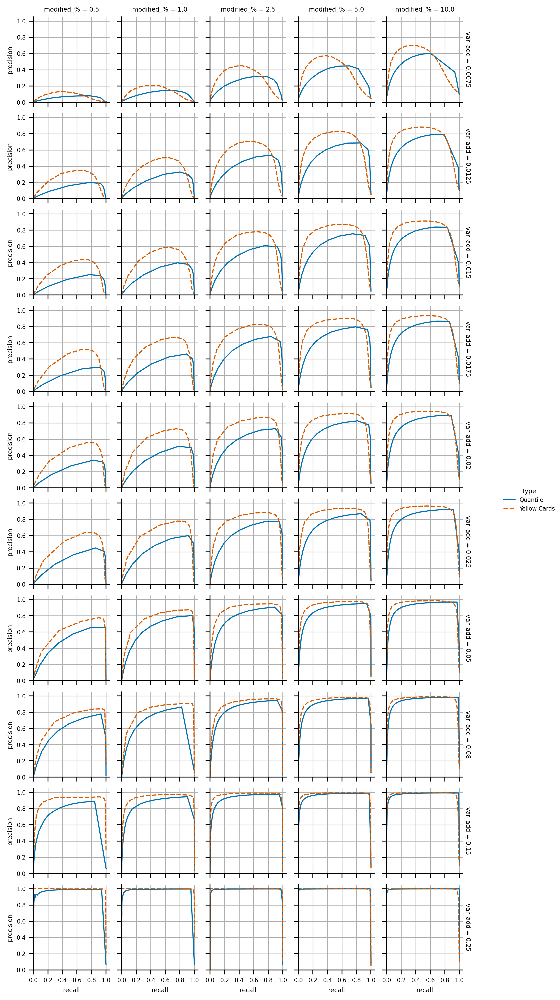

In [90]:
fg = sns.relplot(
    data=results.sort_index(level="type").reset_index(),
    x="recall",
    y="precision",
    hue="type",
    style="type",
    col="modified_%",
    row="var_add",
    kind="line",
    markers=False,
    palette="colorblind_reordered",
    height=1.5,
    aspect=1,
    facet_kws={"margin_titles": True},
)
for ax in fg.axes.flatten():
    ax.grid(True)
fg.set(xlim=(0, 1.05))
fg.set(ylim=(0, 1.05))
fg.set(xticks=np.linspace(0, 1, 6))
fg.set(yticks=np.linspace(0, 1, 6))
fg.figure.set_dpi(300)
fg.tight_layout()
fg.savefig(BASE_DIR / "reports/figures/Figure_S35.png", dpi=1000)
fg.savefig(BASE_DIR / "reports/figures/Figure_S35.eps")

In [ ]:
auc_results = []
for i in results.index.get_level_values("modified_%").unique():
    for j in results.index.get_level_values("var_add").unique():
        xs = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Yellow Cards", level="type")["recall"]
            .to_numpy()
        )
        ys = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Yellow Cards", level="type")["precision"]
            .to_numpy()
        )
        ys = ys[np.argsort(xs)]
        xs = xs[np.argsort(xs)]
        auc_results.append((i, j, "yellow cards", round(auc(xs, ys), 3)))

        xs = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Quantile", level="type")["recall"]
            .to_numpy()
        )
        ys = (
            results.xs(i, level="modified_%")
            .xs(j, level="var_add")
            .xs("Quantile", level="type")["precision"]
            .to_numpy()
        )
        ys = ys[np.argsort(xs)]
        xs = xs[np.argsort(xs)]
        auc_results.append((i, j, "quant", round(auc(xs, ys), 3)))
plot_df = pd.DataFrame(auc_results).set_index([0, 1, 2]).unstack(2)
plot_df

3             
2            quant yellow cards
0    1                         
0.5  0.0075  0.057        0.081
     0.0125  0.135        0.244
     0.0150  0.170        0.311
     0.0175  0.201        0.364
     0.0200  0.229        0.402
     0.0250  0.300        0.468
     0.0500  0.487        0.600
     0.0800  0.575        0.689
     0.1500  0.714        0.902
     0.2500  0.949        0.996
1.0  0.0075  0.105        0.137
     0.0125  0.231        0.367
     0.0150  0.283        0.436
     0.0175  0.325        0.509
     0.0200  0.368        0.562
     0.0250  0.434        0.612
     0.0500  0.636        0.745
     0.0800  0.645        0.804
     0.1500  0.845        0.935
     0.2500  0.966        0.998
2.5  0.0075  0.241        0.309
     0.0125  0.404        0.551
     0.0150  0.466        0.632
     0.0175  0.522        0.684
     0.0200  0.572        0.737
     0.0250  0.625        0.775
     0.0500  0.776        0.876
     0.0800  0.840        0.897
     0.1500  0.929        0.970
     0.2500  0.992        0.998
5.0  0.0075  0.346        0.399
     0.0125  0.559        0.685
     0.0150  0.617        0.748
     0.0175  0.660        0.793
     0.0200  0.693        0.817
     0.0250  0.740        0.851
     0.0500  0.863        0.923
     0.0800  0.902        0.939
     0.1500  0.953        0.977
     0.2500  0.992        0.997
10.0 0.0075  0.470        0.519
     0.0125  0.650        0.745
     0.0150  0.706        0.802
     0.0175  0.739        0.835
     0.0200  0.770        0.860
     0.0250  0.815        0.897
     0.0500  0.906        0.939
     0.0800  0.939        0.953
     0.1500  0.977        0.976
     0.2500  0.997        0.992